## Data Preprocessing

In this first part, our aim is to upload the dataset and verify its integrity by checking the data types, as well as identifying any missing or inconsistent values.

In [ ]:
pip install dcor

In [ ]:
pip install lifelines

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.7/115.7 kB 13.3 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4030 sha256=339988f7e3a17c6b2b7cec995fc9abef2d8f40be1af855481bdb1f4fa391e40c
  Stored in directory: /root/.cache/pip/wheels/8b/67/f4/2caaae2146198dcb824f31a303833b07b14a5ec863fb3acd7b
Successfully built autograd-gamma


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
from scipy.stats import shapiro
import seaborn as sns
import math
import statsmodels.api as sm
from matplotlib.backends.backend_pdf import PdfPages
#import dcor
from statsmodels.tsa.stattools import pacf
from sklearn.feature_selection import mutual_info_regression
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import adfuller
import pywt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, SimpleRNN, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.metrics import roc_curve, auc
from xgboost import XGBRegressor


from google.colab import files
uploaded=files.upload()



Saving Prognostic_dataset.csv to Prognostic_dataset.csv


In [ ]:
df = pd.read_csv('Prognostic_dataset.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499 entries, 0 to 498
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      499 non-null    int64  
 1   batterie        499 non-null    float64
 2   inverter        499 non-null    float64
 3   conversione     499 non-null    float64
 4   scaricatori     499 non-null    float64
 5   controllo       499 non-null    float64
 6   raffreddamento  499 non-null    float64
 7   RUL             499 non-null    int64  
 8   machine_id      498 non-null    float64
dtypes: float64(7), int64(2)
memory usage: 35.2 KB


In [ ]:
freq=df[df['RUL']==0]['machine_id'].value_counts()
freq[freq>1]

,count
machine_id,
34.0,5
10.0,2
26.0,2
30.0,2
32.0,2
15.0,2
22.0,2
17.0,2
3.0,2


Some machines have two or more consecutive records where their RUL equals 0, which is clearly an error. Therefore, we keep only the first row for each machine where the RUL is 0.

In [ ]:
def preprocessing_data(df):
    df = df.dropna().copy()  # Remove rows with NaN values
    df["rul_zero"] = (df["RUL"] == 0) #flag for RUL = 0
    df["rul_zero_cum"] = df.groupby("machine_id")["rul_zero"].cumsum() #counting the records  w RUL = 0 for each machine_id
    df = df[(df["RUL"] != 0) | (df["rul_zero_cum"] == 1)] #keeping records w RUL != 0 or with sum = 0 of Rul = 0
    df = df.drop(columns=["rul_zero", "rul_zero_cum"])

    return df

In [ ]:
df = preprocessing_data(df)
df

,Unnamed: 0,batterie,inverter,conversione,scaricatori,controllo,raffreddamento,RUL,machine_id
1,1,0.5229,0.5070,0.5098,0.5371,0.5256,0.5330,13,2.0
2,2,0.5126,0.5180,0.5133,0.5170,0.5090,0.5323,12,2.0
3,3,0.5063,0.5067,0.5058,0.5170,0.5022,0.5185,11,2.0
4,4,0.5174,0.4994,0.5007,0.5371,0.5265,0.5120,10,2.0
5,5,0.5122,0.5266,0.5066,0.5372,0.5135,0.5253,9,2.0
...,...,...,...,...,...,...,...,...,...
489,489,0.5175,0.5286,0.5034,0.5371,0.5103,0.5146,3,32.0
490,490,0.5211,0.4820,0.5106,0.5371,0.5124,0.5157,2,32.0
491,491,0.5226,0.5007,0.5107,0.5371,0.4878,0.5280,1,32.0
492,492,0.5182,0.5353,0.5146,0.4968,0.4884,0.5193,0,32.0


In [ ]:
def plot_cycle_counts(df, machine_col='machine_id', title='Number of distinct cycles for each machine_id'):

    cycle_counts = df[machine_col].value_counts()
    cycle_counts_sorted = cycle_counts.sort_values(ascending=False)

    plt.figure(figsize=(12, 6))
    ax = cycle_counts_sorted.plot(kind='bar', color='skyblue')

    plt.title(title)
    plt.xlabel('Machine ID')
    plt.ylabel('Number of distinct cycles')
    plt.grid(axis='y', linestyle='--', linewidth=0.5)
    plt.xticks(rotation=45)

    for i, value in enumerate(cycle_counts_sorted.values):
        ax.text(i, value + 1, str(value), ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


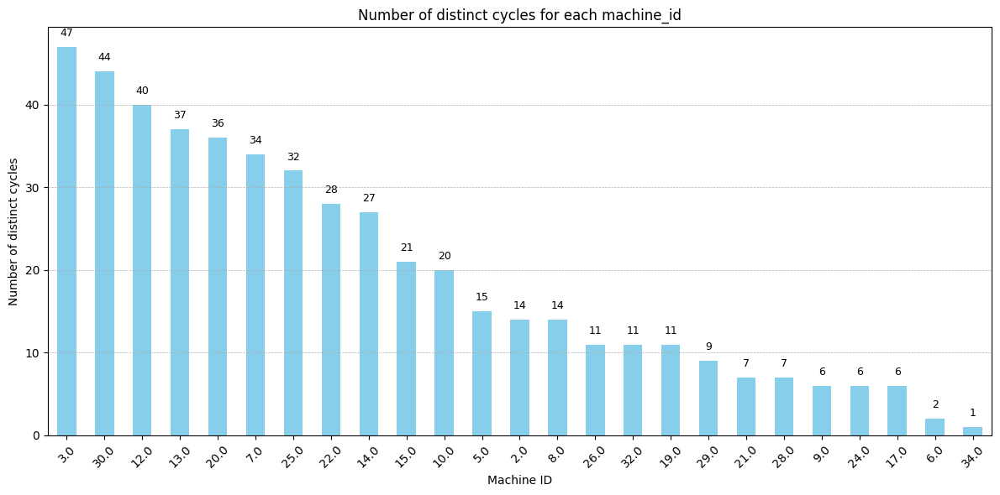

In [ ]:
plot_cycle_counts(df)

After removing the multiple rows with RUL = 0 for the same machine, we notice that machine 34 is left with only one row (Which has RUL=0). Having only one row for a machine cycle does not provide enough information to understand why that machine failed. For this reason, we drop that row. The same occurs for Machine 6 which has an insufficient number of cycles so it does not provide meaningful information for RUL prediction and is therefore removed from the dataset.



In [ ]:
def filter_machines_by_cycle_count(df, min_cycles, machine_col='machine_id'):
    cycle_counts = df[machine_col].value_counts()
    valid_ids = cycle_counts[cycle_counts >= min_cycles].index
    df_filtered = df[df[machine_col].isin(valid_ids)].copy()
    return df_filtered


We remove all the machines with less than 5 cicles.

In [ ]:
df = filter_machines_by_cycle_count(df, min_cycles=5)

In [ ]:
len(df["machine_id"].unique())

23

We know that each row represents a cycle for the machine, and each cycle lasts 3 hours. Since this information is not explicitly included in the data, we add it.

In [ ]:
def changing_columns(df):
    df.drop(columns=["Unnamed: 0"],inplace = True)
    df["cycle"] = df.groupby("machine_id").cumcount()
    df["time"] = df["cycle"] * 3

    return df

In [ ]:
df = changing_columns(df)
df

,batterie,inverter,conversione,scaricatori,controllo,raffreddamento,RUL,machine_id,cycle,time
1,0.5229,0.5070,0.5098,0.5371,0.5256,0.5330,13,2.0,0,0
2,0.5126,0.5180,0.5133,0.5170,0.5090,0.5323,12,2.0,1,3
3,0.5063,0.5067,0.5058,0.5170,0.5022,0.5185,11,2.0,2,6
4,0.5174,0.4994,0.5007,0.5371,0.5265,0.5120,10,2.0,3,9
5,0.5122,0.5266,0.5066,0.5372,0.5135,0.5253,9,2.0,4,12
...,...,...,...,...,...,...,...,...,...,...
488,0.5213,0.5451,0.4907,0.5372,0.5243,0.5198,4,32.0,6,18
489,0.5175,0.5286,0.5034,0.5371,0.5103,0.5146,3,32.0,7,21
490,0.5211,0.4820,0.5106,0.5371,0.5124,0.5157,2,32.0,8,24
491,0.5226,0.5007,0.5107,0.5371,0.4878,0.5280,1,32.0,9,27


# Exploratory Data Analysis

In [ ]:
df.describe()

,batterie,inverter,conversione,scaricatori,controllo,raffreddamento,RUL,machine_id,cycle,time,total_cycles,frac_left
count,483.000000,483.000000,483.000000,483.000000,483.000000,483.000000,483.000000,483.000000,483.000000,483.000000,483.000000,483.000000
mean,0.513427,0.513210,0.501779,0.523813,0.518641,0.520849,14.211180,15.848861,14.211180,42.633540,28.422360,0.500000
std,0.006832,0.021465,0.007102,0.015811,0.016398,0.007179,11.234068,8.898455,11.234068,33.702203,12.727746,0.303536
min,0.493200,0.435900,0.472000,0.455400,0.448200,0.500500,0.000000,2.000000,0.000000,0.000000,5.000000,0.000000
25%,0.509100,0.499000,0.496950,0.517000,0.509400,0.515600,5.000000,8.000000,5.000000,15.000000,19.000000,0.230769
50%,0.513200,0.514600,0.502600,0.517200,0.524500,0.521200,11.000000,14.000000,11.000000,33.000000,31.000000,0.500000
75%,0.518050,0.528850,0.507300,0.537100,0.531200,0.526800,22.000000,22.000000,22.000000,66.000000,39.000000,0.769231
max,0.534200,0.559600,0.514600,0.537200,0.542000,0.535000,46.000000,32.000000,46.000000,138.000000,46.000000,1.000000


The Shapiro-Wilk test checks if sensor data follow a normal distribution, which is important for reliable analysis in machine prognostics. Normality helps ensure the accuracy of measurements, supports anomaly and fault detection, and validates reliability metrics. Verifying normality improves the robustness and trustworthiness of the diagnostic process, even beyond predictive modeling.

'Batterie' is normal over all the machines, meanwhile some other features like 'Scaricatori' or 'Controllo' are almost never normal.



In [ ]:
def check_normality_summary(df, exclude_cols=None, verbose=True):
    if exclude_cols is None:
        exclude_cols = ['RUL', 'machine_id', 'time', 'cycle']

    feature_cols = [col for col in df.select_dtypes(include='number').columns if col not in exclude_cols]
    results = []

    for machine in sorted(df['machine_id'].unique()):
        if verbose:
            print(f"\nMachine ID: {int(machine)}")
        subset = df[df['machine_id'] == machine]

        for col in feature_cols:
            series = subset[col].dropna()
            unique_vals = series.nunique()

            if unique_vals < 3:
                status = "Insufficient data (n_unique < 3)"
                if verbose:
                    print(f"  → {col}: {status}")
                results.append({
                    "machine_id": int(machine),
                    "feature": col,
                    "status": status
                })
                continue

            try:
                stat, p = shapiro(series)
                status = "Normally distributed" if p > 0.05 else "Not normally distributed"
                if verbose:
                    print(f"  → {col}: p = {p:.4f} → {status}")
            except Exception as e:
                status = f"Test error: {str(e)}"
                if verbose:
                    print(f"  → {col}: {status}")

            results.append({
                "machine_id": int(machine),
                "feature": col,
                "status": status
            })

    results_df = pd.DataFrame(results)
    summary = results_df.groupby(['feature', 'status']).size().unstack(fill_value=0).reset_index()

    if verbose:
        print("\nSummary:")
        print(summary)
    return results_df, summary # Return results_df and summary

In [ ]:
results_df, summary = check_normality_summary(df, verbose=True)
# print(summary) # Removed redundant print


Machine ID: 2
  → batterie: p = 0.9276 → Normally distributed
  → inverter: p = 0.9392 → Normally distributed
  → conversione: p = 0.4420 → Normally distributed
  → scaricatori: p = 0.0009 → Not normally distributed
  → controllo: p = 0.7481 → Normally distributed
  → raffreddamento: p = 0.2437 → Normally distributed

Machine ID: 3
  → batterie: p = 0.1619 → Normally distributed
  → inverter: p = 0.7087 → Normally distributed
  → conversione: p = 0.1145 → Normally distributed
  → scaricatori: p = 0.0000 → Not normally distributed
  → controllo: p = 0.0062 → Not normally distributed
  → raffreddamento: p = 0.5931 → Normally distributed

Machine ID: 5
  → batterie: p = 0.6135 → Normally distributed
  → inverter: p = 0.2886 → Normally distributed
  → conversione: p = 0.4429 → Normally distributed
  → scaricatori: p = 0.0013 → Not normally distributed
  → controllo: p = 0.0939 → Normally distributed
  → raffreddamento: p = 0.7310 → Normally distributed

Machine ID: 7
  → batterie: p = 0.9

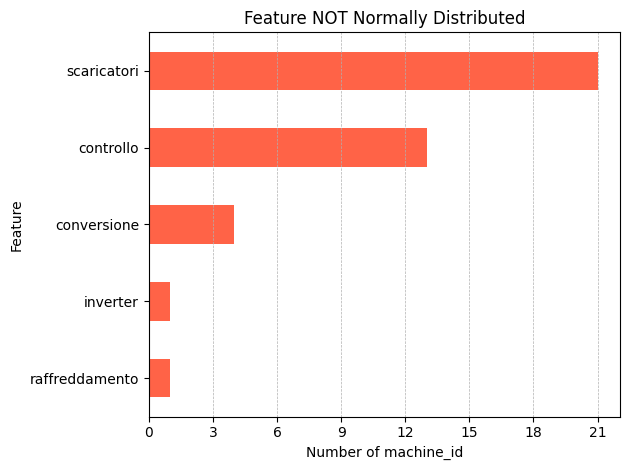

In [ ]:
non_normal_counts = results_df[results_df['status'] == "Not normally distributed"]['feature'].value_counts()

ax = non_normal_counts.head(10).plot(kind='barh', title='Feature NOT Normally Distributed', color='tomato')

plt.xlabel("Number of machine_id")
plt.ylabel("Feature")


ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

plt.grid(axis='x', linestyle='--', linewidth=0.5)
plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()

Checking with Violin Plots the distribution of all the features for the different machines. "Controllo", "Scaricatori", "Conversione" are the only features which don't show normality over the entire dataset.

In [ ]:
def plot_violin_distributions(df, feature_cols, group_col='machine_id', plots_per_row=2, figsize_per_plot=(6, 4)):
    total_plots = len(feature_cols)
    rows = math.ceil(total_plots / plots_per_row)
    fig, axes = plt.subplots(rows, plots_per_row, figsize=(figsize_per_plot[0]*plots_per_row, figsize_per_plot[1]*rows))
    axes = axes.flatten()

    for i, col in enumerate(feature_cols):
        ax = axes[i]
        sns.violinplot(data=df, x=group_col, y=col, inner='box', ax=ax)
        ax.set_title(f"Distribuzione di {col} per {group_col}")
        ax.set_xlabel(group_col)
        ax.set_ylabel(col)
        ax.tick_params(axis='x', rotation=45)


    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()



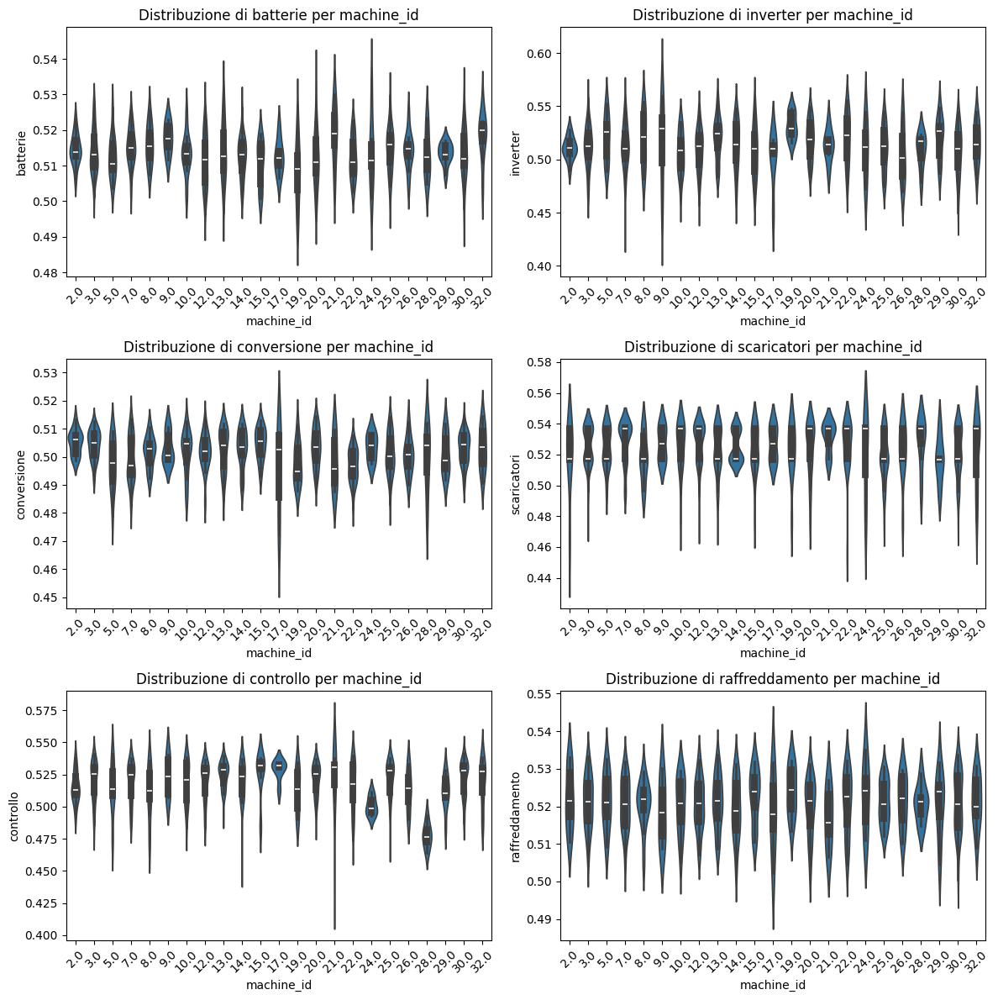

In [ ]:
feature_cols = ['batterie','inverter','conversione','scaricatori','controllo','raffreddamento']

plot_violin_distributions(df, feature_cols)


QQ plots were also generated for each sensor in every machine. We observe that sensors related to ‘Scaricatori’ and ‘Controlli’ units display step-like patterns, particularly the ‘Scaricatori’ sensors, confirming what was indicated by the Shapiro-Wilk test.

In [ ]:
def generate_qqplots_per_machine(df, feature_cols, pdf_path="qqplots_per_machine.pdf"):
    with PdfPages(pdf_path) as pdf:
        for m_id in sorted(df['machine_id'].unique()):
            df_machine = df[df['machine_id'] == m_id]

            n_features = len(feature_cols)
            n_cols = 3
            n_rows = (n_features + n_cols - 1) // n_cols

            fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*4))
            axes = axes.flatten()

            for i, feature in enumerate(feature_cols):
                sm.qqplot(df_machine[feature], line='s', ax=axes[i])
                axes[i].set_title(f'{feature} - Machine {int(m_id)}')

            for j in range(i + 1, len(axes)):
                fig.delaxes(axes[j])

            plt.tight_layout()
            plt.show()
            pdf.savefig(fig)
            plt.close(fig)

    print(f"✅ File PDF salvato in: {pdf_path}")
    files.download(pdf_path)


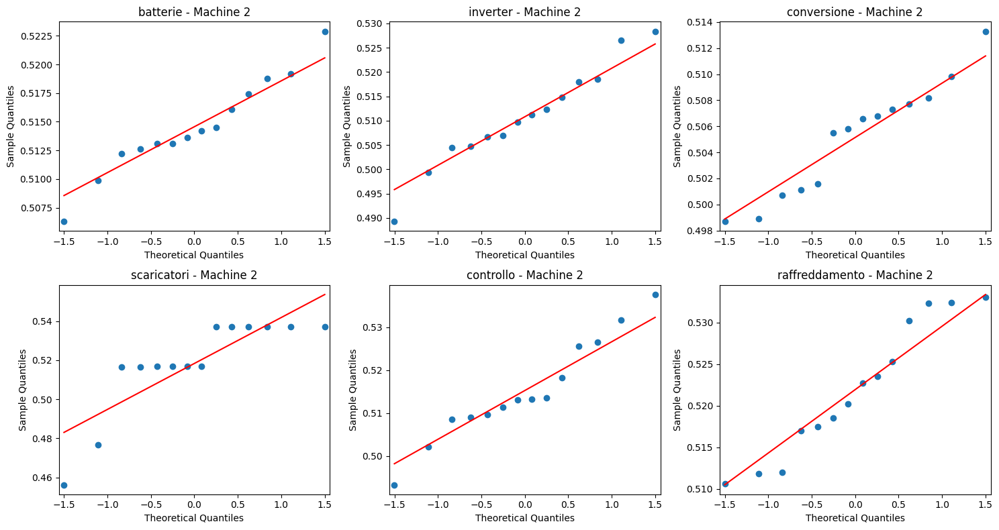

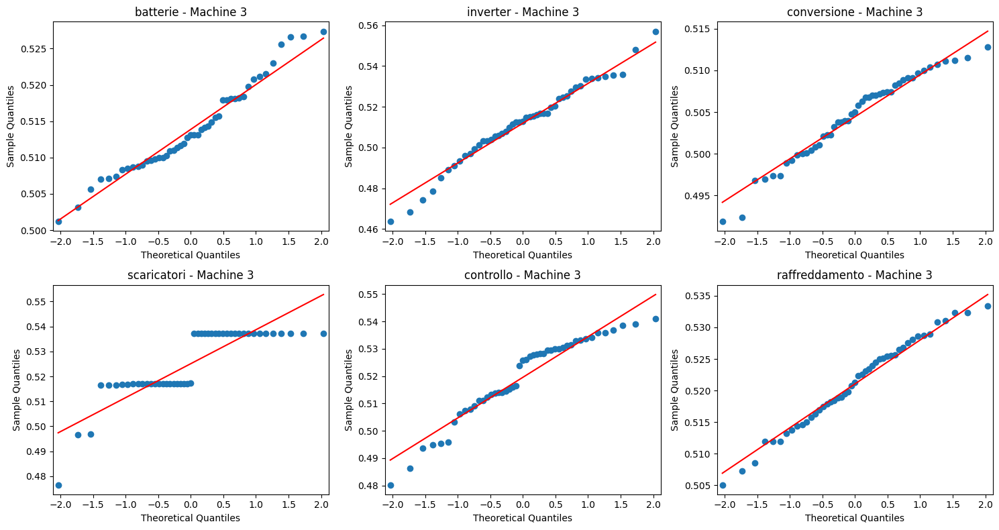

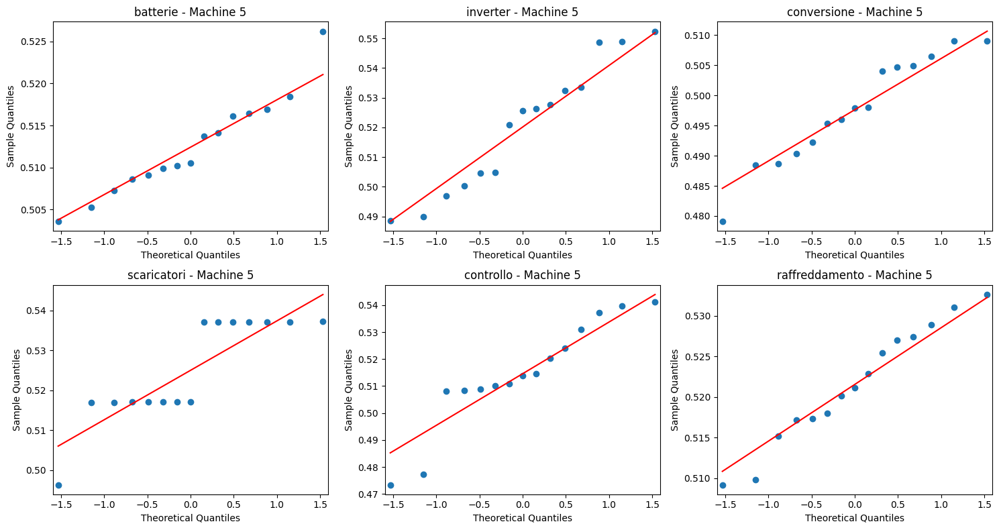

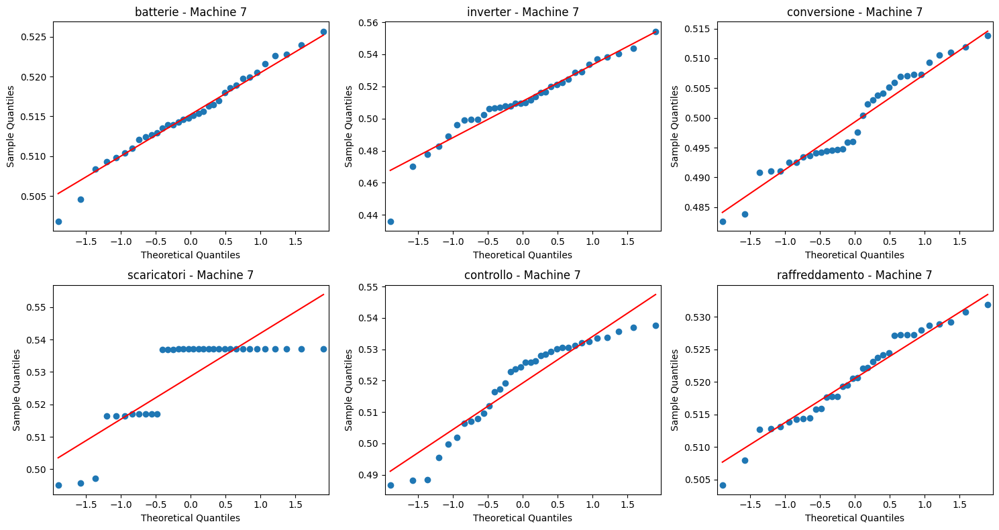

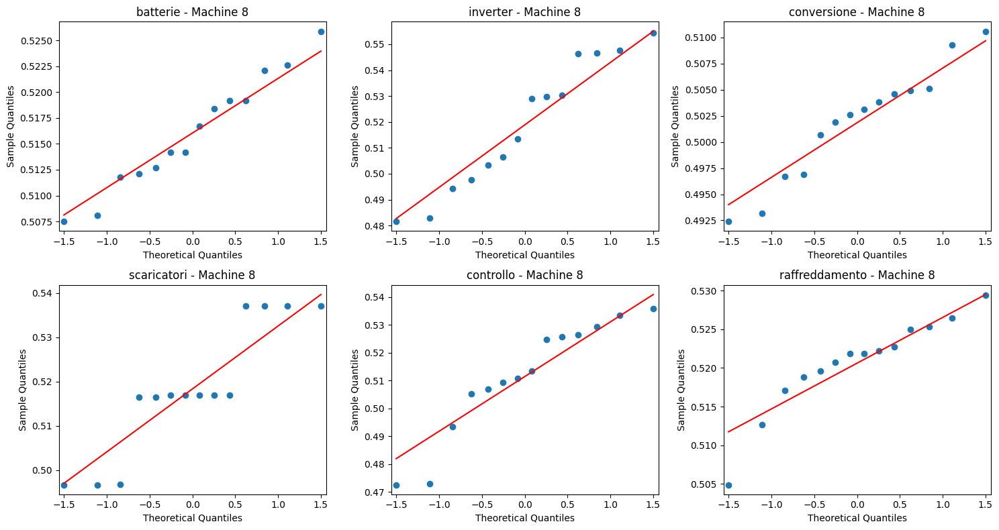

...

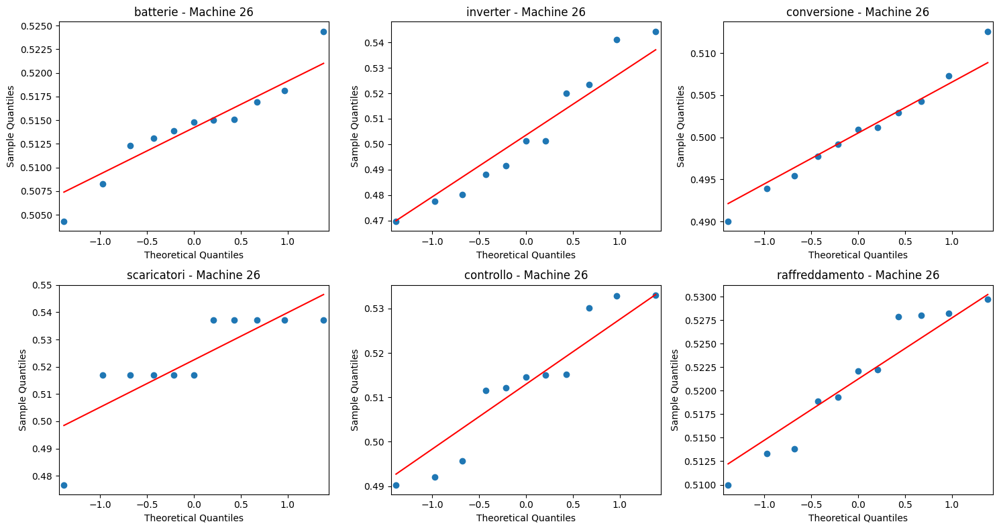

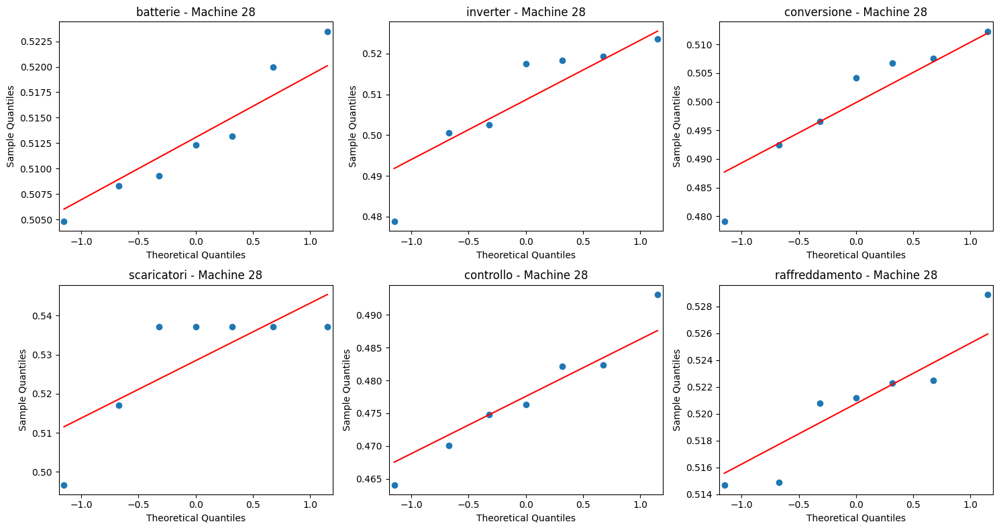

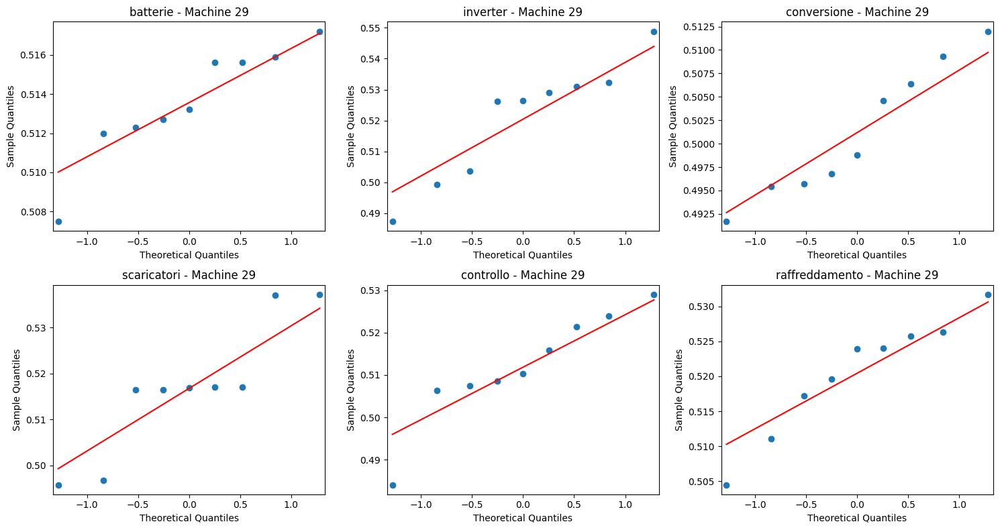

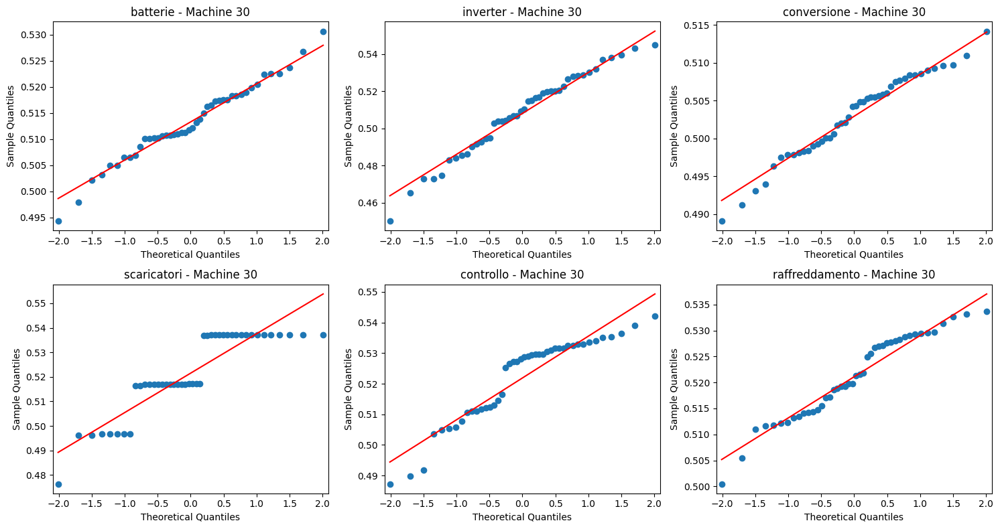

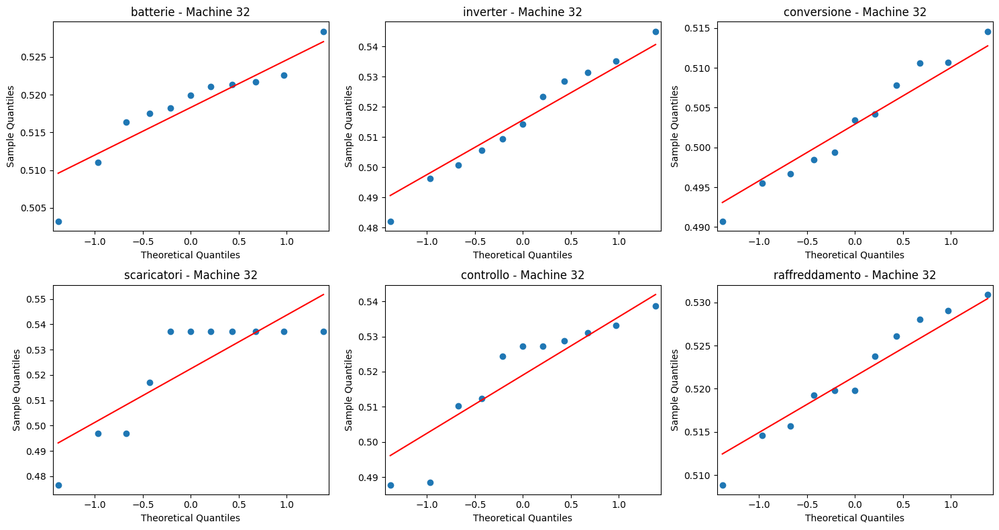

✅ File PDF salvato in: /content/qqplots_per_machine.pdf


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
pdf_path = "/content/qqplots_per_machine.pdf"
generate_qqplots_per_machine(df, feature_cols, pdf_path=pdf_path)

In the analysis of time series data with respect to RUL, we observe that in most sensors the signals tend to diverge as RUL approaches zero, suggesting instability or degradation near failure. An exception may be seen in the ‘Raffreddamento’ sensor, which appears more stable.
On the other hand, analyzing sensor behavior over time allows us to explore more specific patterns and details for each machine.

In [ ]:
def plot_rul_vs_features(df, feature_cols, pdf_path="rul_vs_features.pdf", max_features=6):
    selected_features = feature_cols[:max_features]

    with PdfPages(pdf_path) as pdf:
        fig, axes = plt.subplots(3, 2, figsize=(15, 12))  # 3 righe, 2 colonne
        axes = axes.flatten()

        for i, feature in enumerate(selected_features):
            ax = axes[i]
            for m in sorted(df['machine_id'].unique()):
                sub = df[df['machine_id'] == m]
                ax.plot(sub['RUL'], sub[feature], label=f'Machine {int(m)}')
            ax.set_title(f'{feature} vs RUL')
            ax.set_xlabel('RUL')
            ax.set_ylabel(feature)
            ax.grid(True)

        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])  # Rimuove i subplot inutilizzati

        fig.suptitle("Feature values vs RUL for each machine", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.96])

        plt.show()
        pdf.savefig(fig)
        plt.close(fig)

    print(f"✅ Grafico salvato in: {pdf_path}")
    files.download(pdf_path)


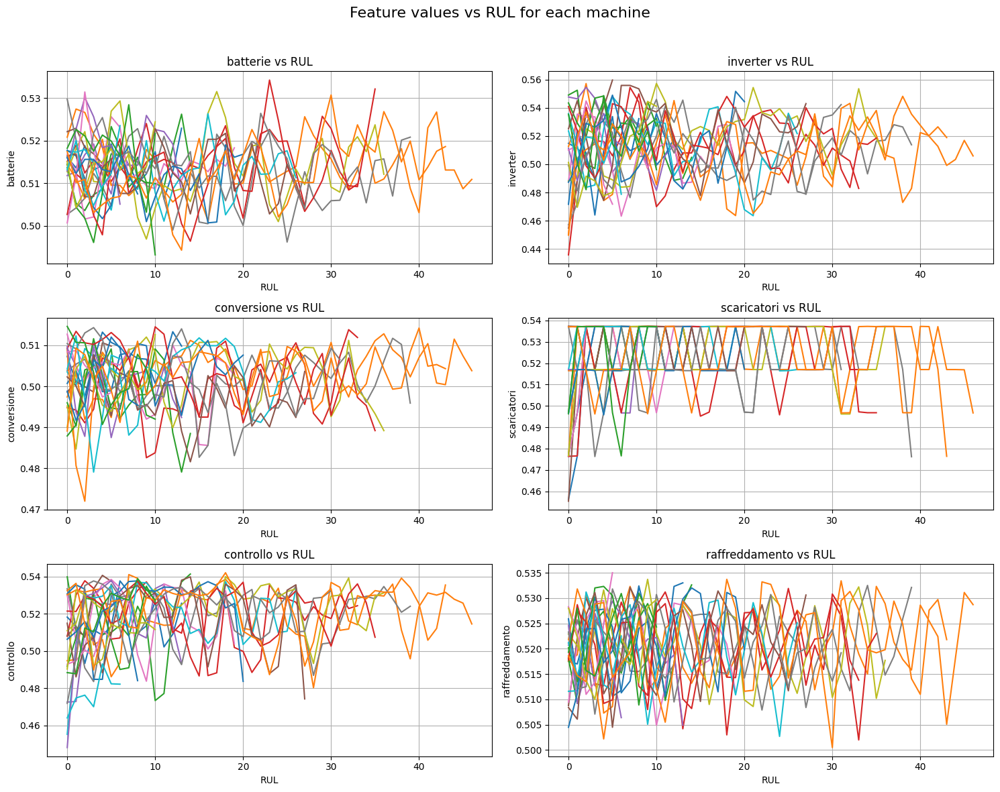

✅ Grafico salvato in: /content/rul_vs_features.pdf


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
pdf_path = "/content/rul_vs_features.pdf"
plot_rul_vs_features(df, feature_cols, pdf_path=pdf_path, max_features=6)

In [ ]:
def plot_time_series_per_feature(df, feature_cols, pdf_path="time_series_per_feature.pdf"):

    with PdfPages(pdf_path) as pdf:
        for feature in feature_cols:
            fig, ax = plt.subplots(figsize=(15, 4))

            for m in sorted(df['machine_id'].unique()):
                sub = df[df['machine_id'] == m]
                ax.plot(sub['time'], sub[feature], label=f'Machine {int(m)}')

            ax.set_title(f'{feature} over time for each machine')
            ax.set_xlabel('Time (hours)')
            ax.set_ylabel(feature)
            ax.legend(loc='upper right', fontsize='small', ncol=3)
            ax.grid(True)

            plt.tight_layout()
            pdf.savefig(fig)
            plt.show()
            plt.close(fig)

    print(f"✅ File PDF salvato in: {pdf_path}")
    files.download(pdf_path)


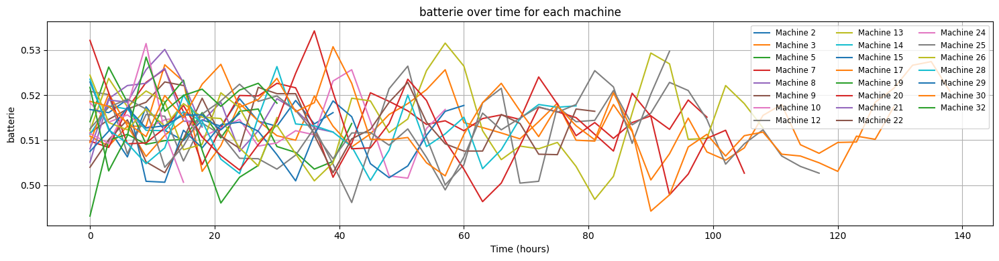

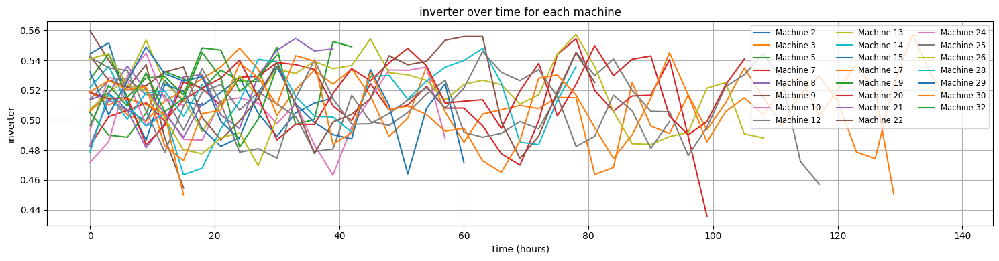

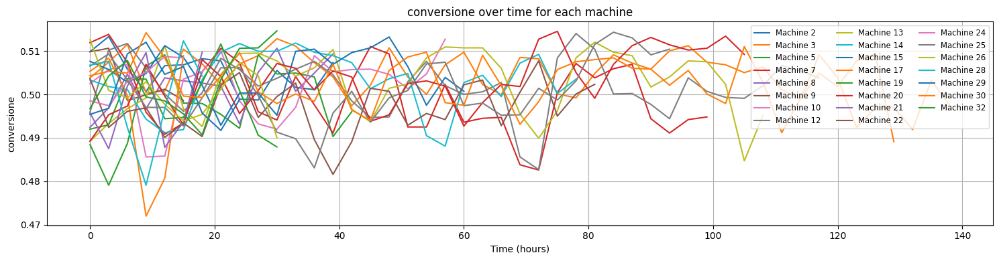

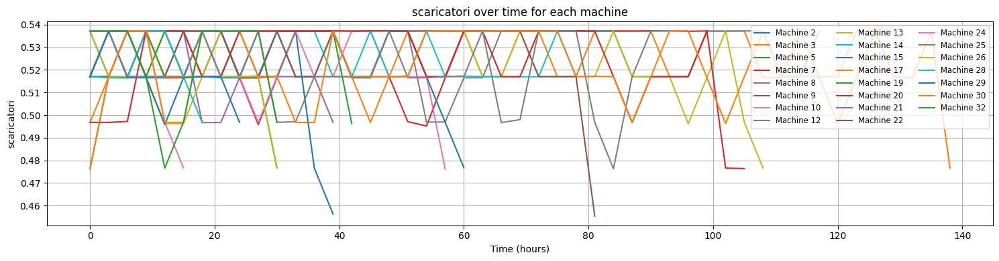

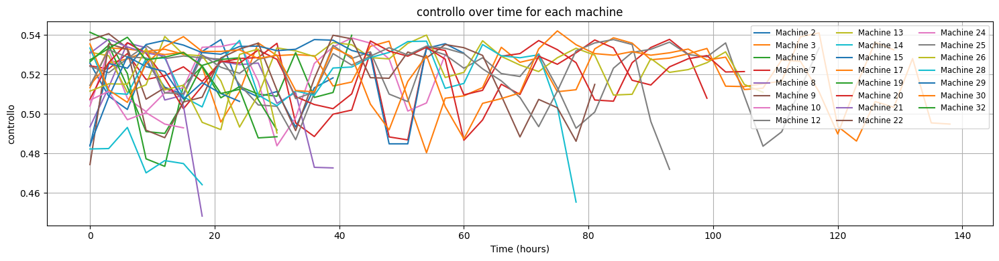

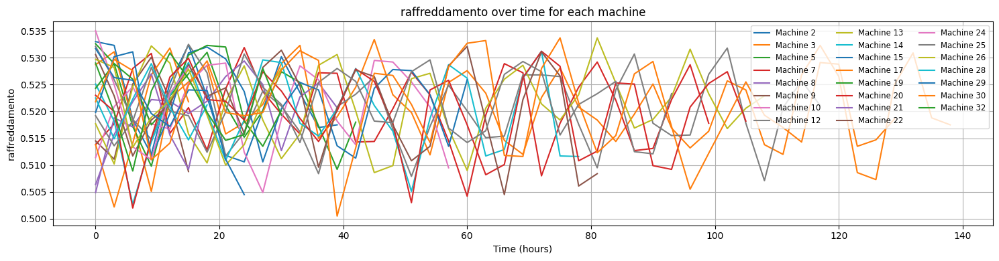

✅ File PDF salvato in: /content/time_series_per_feature.pdf


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
pdf_path = "/content/time_series_per_feature.pdf"
plot_time_series_per_feature(df, feature_cols, pdf_path=pdf_path)

It is possible to produce a correlation matrix to examine the relationships between sensors and RUL, as well as among the sensors themselves. As expected, RUL is negatively correlated with the cycle count. Overall, the correlations appear to be generally weak. Among the sensors, 'Controllo' shows the strongest correlation with RUL, with a value of 0.16

/usr/local/lib/python3.11/dist-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(float64, 1d, C), array(int64, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(int64, 1d, C), array(float64, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(int64, 1d, C), a

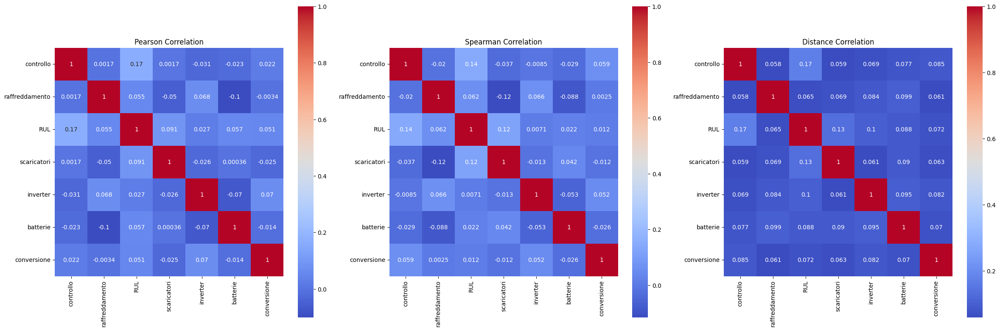

In [ ]:
def correlation_heatmap(dataframe: pd.DataFrame, indicators: list[str]):
    """Plot correlation heatmaps between given indicators using Pearson, Spearman, and Distance correlation methods."""

    fig, axes = plt.subplots(1, 3, figsize=(24, 8))  # 1 row, 3 columns for each correlation method

    #Pearson correlation
    corr_matrix_pearson = dataframe[indicators].corr(method='pearson')
    sns.heatmap(corr_matrix_pearson, vmax=1.0, annot=True, ax=axes[0], cmap="coolwarm", square=True)
    axes[0].set_title('Pearson Correlation')

    #Spearman correlation
    corr_matrix_spearman = dataframe[indicators].corr(method='spearman')
    sns.heatmap(corr_matrix_spearman, vmax=1.0, annot=True, ax=axes[1], cmap="coolwarm", square=True)
    axes[1].set_title('Spearman Correlation')

    #Distance correlation
    corr_matrix_distance = pd.DataFrame(index=indicators, columns=indicators)
    for col1 in indicators:
        for col2 in indicators:
            corr_matrix_distance.at[col1, col2] = dcor.distance_correlation(dataframe[col1], dataframe[col2])

    sns.heatmap(corr_matrix_distance.astype(float), vmax=1.0, annot=True, ax=axes[2], cmap="coolwarm", square=True)
    axes[2].set_title('Distance Correlation')

    plt.tight_layout()
    plt.show()

    return corr_matrix_pearson, corr_matrix_spearman, corr_matrix_distance


indicator_list = ['controllo', 'raffreddamento', 'RUL', 'scaricatori', 'inverter', 'batterie', 'conversione']
corr_p, corr_s, corr_d = correlation_heatmap(df, indicator_list)


In [ ]:
def merge_and_plot_correlation_heatmaps(corr_matrix_pearson, corr_matrix_spearman, corr_matrix_distance):
    """Merge Pearson, Spearman, and Distance correlation matrices and plot the max correlation per cell with method indicator."""

    indicators = corr_matrix_pearson.index  #ensure that matrixes have the same indexes

    #max value of type (P/S/D)
    merged_corr = pd.DataFrame(index=indicators, columns=indicators)
    corr_type = pd.DataFrame(index=indicators, columns=indicators)

    for i in indicators:
        for j in indicators:
            values = {
                'P': float(corr_matrix_pearson.loc[i, j]),
                'S': float(corr_matrix_spearman.loc[i, j]),
                'D': float(corr_matrix_distance.loc[i, j])
            }
            max_type = max(values, key=lambda k: abs(values[k]))  # Se preferisci il valore assoluto massimo
            max_value = values[max_type]
            merged_corr.loc[i, j] = max_value
            corr_type.loc[i, j] = max_type

    plt.figure(figsize=(10, 8))
    sns.heatmap(merged_corr.astype(float), annot=False, fmt=".2f", cmap='coolwarm', cbar=True)

    #anntation with type (P/S/D)
    for i in range(len(indicators)):
        for j in range(len(indicators)):
            plt.text(j + 0.5, i + 0.5, corr_type.iloc[i, j],
                     ha='center', va='center',
                     color='white' if abs(float(merged_corr.iloc[i, j])) > 0.5 else 'black',
                     fontsize=12, fontweight='bold')

    plt.xticks(np.arange(0.5, len(indicators)), indicators, rotation=45)
    plt.yticks(np.arange(0.5, len(indicators)), indicators, rotation=0)
    plt.title('Merged Correlation Heatmap with Method Indicator')
    plt.tight_layout()
    plt.show()

    return merged_corr, corr_type


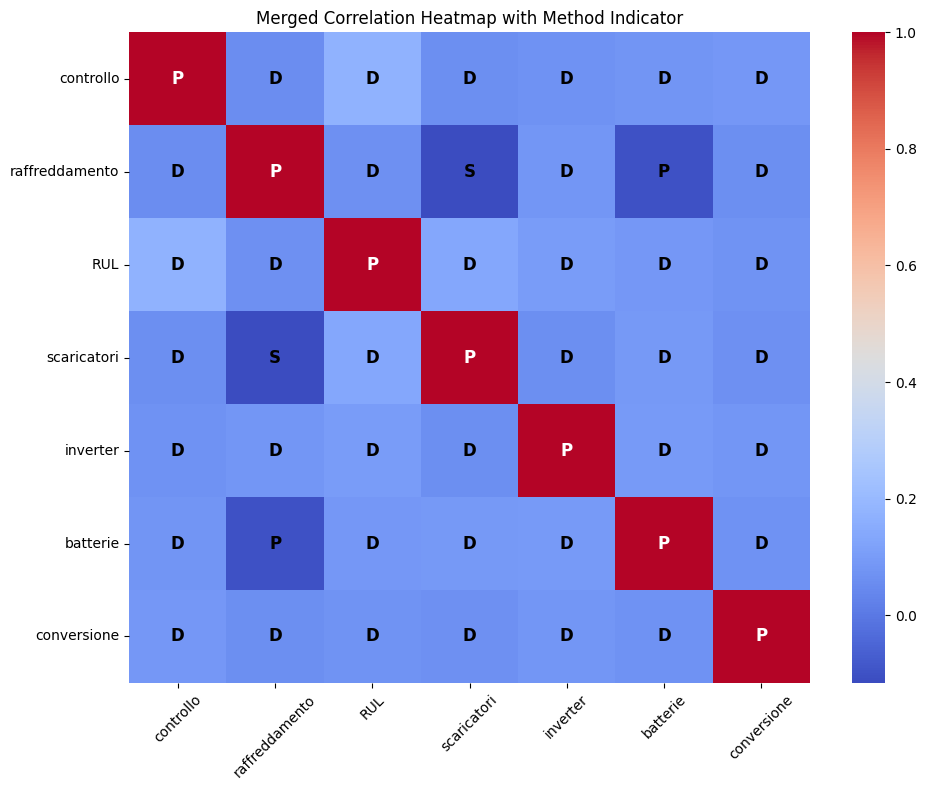

In [ ]:
merged_corr, corr_type = merge_and_plot_correlation_heatmaps(corr_p, corr_s, corr_d)


The most predominant correlation method observed in our analysis is the distance correlation. This method stands out because it is capable of detecting a wide range of dependencies between variables, including linear, nonlinear, monotonic, and non-monotonic relationships. Unlike traditional correlation measures such as Pearson and Spearman, distance correlation does not rely on assumptions of linearity or monotonicity, making it particularly effective for capturing complex interactions in the data.

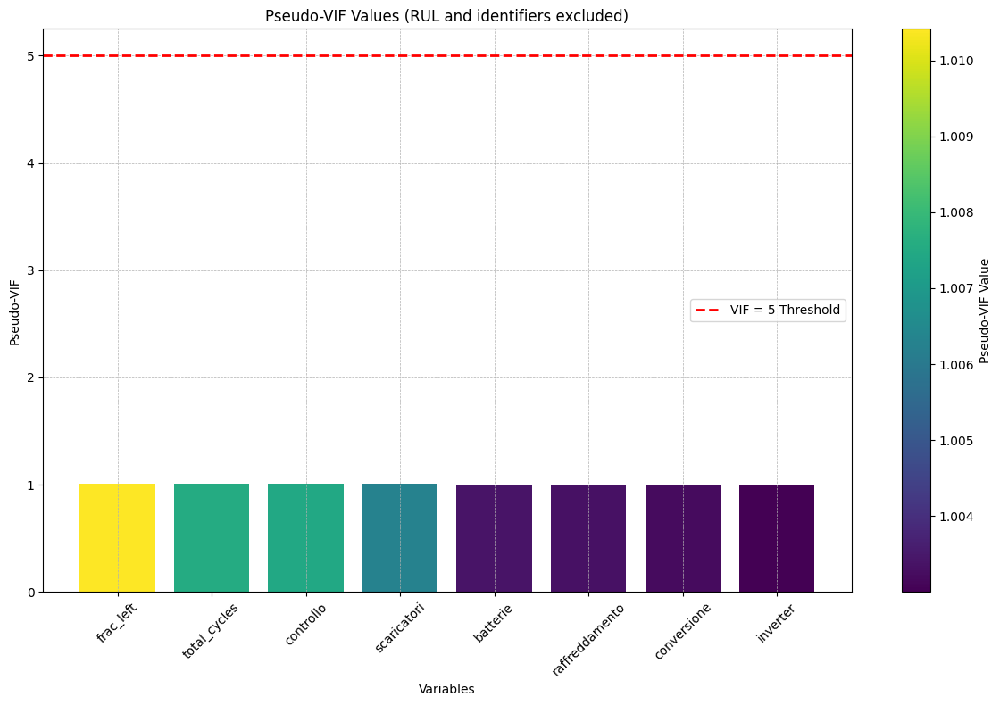

In [ ]:
full_corr = df.corr()

exclude = ['RUL', 'machine_id', 'Unnamed: 0', 'time', 'cycle']
corr_for_vif = full_corr.drop(index=exclude, columns=exclude, errors='ignore')

def calculate_pseudo_vif(corr_matrix):
    corr_matrix_no_diag = corr_matrix.copy()
    np.fill_diagonal(corr_matrix_no_diag.values, np.nan)
    pseudo_r_squared = corr_matrix_no_diag.apply(lambda x: np.nanmean(x**2), axis=1)
    pseudo_vif = 1 / (1 - pseudo_r_squared + 1e-9)
    return pseudo_vif

#Pseudo-VIF
pseudo_vif_values = calculate_pseudo_vif(corr_for_vif)
pseudo_vif_sorted = pseudo_vif_values.sort_values(ascending=False)


norm = plt.Normalize(vmin=pseudo_vif_sorted.min(), vmax=pseudo_vif_sorted.max())
colors = plt.cm.viridis(norm(pseudo_vif_sorted.values))

fig, ax = plt.subplots(figsize=(12, 8))
ax.bar(pseudo_vif_sorted.index, pseudo_vif_sorted.values, color=colors)
ax.set_title('Pseudo-VIF Values (RUL and identifiers excluded)')
ax.set_xlabel('Variables')
ax.set_ylabel('Pseudo-VIF')
ax.tick_params(axis='x', rotation=45)
ax.axhline(y=5, color='red', linestyle='--', linewidth=2, label='VIF = 5 Threshold')
ax.legend()
ax.grid(True, linestyle='--', linewidth=0.5)

sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax, label='Pseudo-VIF Value')

plt.tight_layout()
plt.show()


VIF (Variance Inflation Factor) measures how much the variance of a regression coefficient is inflated by multicollinearity with other features.

*   VIF = 1 → no multicollinearity
*   VIF < 5 → generally acceptable
*   VIF > 5 (or 10) → high multicollinearity

In [ ]:
def analyze_lag_dependence(df, features, max_lag=10):

    pacf_matrix = pd.DataFrame(index=features, columns=range(1, max_lag + 1))
    mi_matrix = pd.DataFrame(index=features, columns=range(1, max_lag + 1))

    for feat in features:
        series = df[feat].dropna()

        # Calcolo PACF
        pacf_vals = pacf(series, nlags=max_lag, method='ywm')
        pacf_matrix.loc[feat] = pacf_vals[1:]

        # Calcolo MI per ogni lag
        for lag in range(1, max_lag + 1):
            lagged_series = series.shift(lag).dropna()
            aligned_series = series.loc[lagged_series.index]

            mi_val = mutual_info_regression(
                aligned_series.values.reshape(-1, 1),
                lagged_series.values
            )
            mi_matrix.loc[feat, lag] = mi_val[0]

    # Converti in float
    pacf_matrix = pacf_matrix.astype(float)
    mi_matrix = mi_matrix.astype(float)

    # Plot PACF heatmap
    plt.figure(figsize=(12, 6))
    sns.heatmap(pacf_matrix, annot=True, cmap='coolwarm', center=0)
    plt.title('PACF Matrix (Feature x Lag)')
    plt.xlabel('Lag')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()

    # Plot MI heatmap
    plt.figure(figsize=(10, 5))
    sns.heatmap(mi_matrix, annot=True, cmap='viridis')
    plt.title('Mutual Information Matrix (Feature x Lag)')
    plt.xlabel('Lag')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()

    return pacf_matrix, mi_matrix


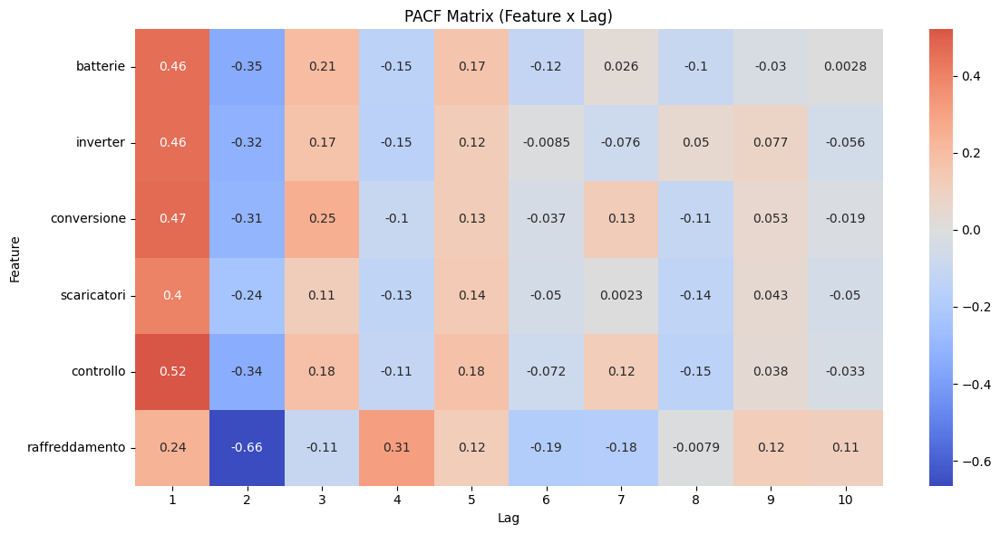

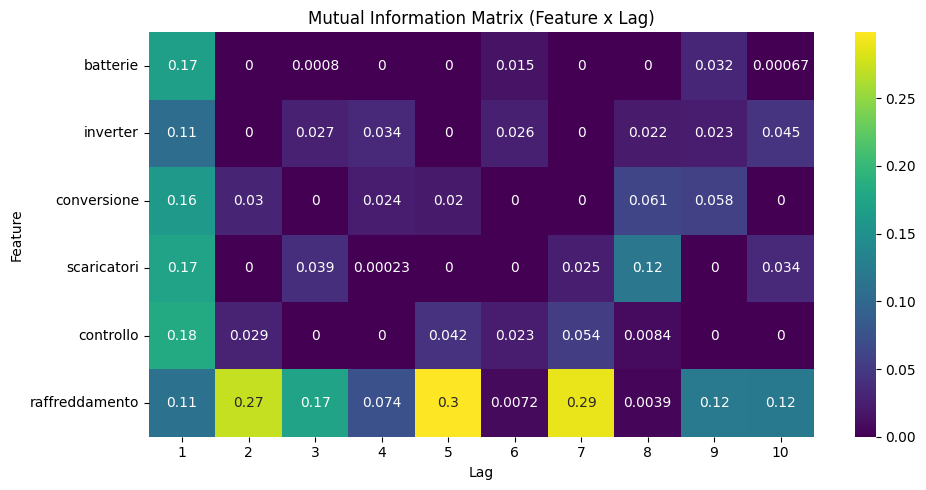

In [ ]:
pacf_matrix, mi_matrix = analyze_lag_dependence(df, feature_cols, max_lag=10)

**The Partial Autocorrelation Function (PACF)** matrix shows how each sensor’s current value is correlated with its past values, after removing the influence of intermediate lags.

**The Mutual Information (MI)** matrix measures how much information is shared between variables, capturing both linear and nonlinear relationships.

Overall, the data do not exhibit temporal correlation, which may be attributed to noise introduced by the simulation process.


In [ ]:
def plot_acf_grid_per_machine(df, feature_cols, pdf_path="acf_grid.pdf", min_values=5, max_lags=20, cols=3):

    machine_ids = df['machine_id'].unique()
    valid_plots_count = 0

    # Conta quanti plot validi ci saranno
    for machine in machine_ids:
        df_machine = df[df['machine_id'] == machine].sort_values("cycle")
        for col in feature_cols:
            if len(df_machine[col].dropna()) >= min_values:
                valid_plots_count += 1

    rows = math.ceil(valid_plots_count / cols)
    fig_grid, axs = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3))
    axs = axs.flatten()
    plot_index = 0

    for machine in machine_ids:
        df_machine = df[df['machine_id'] == machine].sort_values("cycle")
        for col in feature_cols:
            data = df_machine[col].dropna()
            nobs = len(data)

            if nobs < min_values:
                print(f"Pochi dati per {col} macchina {int(machine)}, salto ACF")
                continue

            lags = min(max_lags, nobs - 1)
            ax = axs[plot_index]
            plot_acf(data, lags=lags, zero=False, ax=ax, title="")
            ax.set_title(f"ACF - {col} | Machine {int(machine)}", fontsize=10)
            ax.grid(True)
            plot_index += 1

    # Rimuovi assi in eccesso
    for j in range(plot_index, len(axs)):
        fig_grid.delaxes(axs[j])

    fig_grid.tight_layout()
    plt.show()

    # Salva in PDF
    with PdfPages(pdf_path) as pdf:
        pdf.savefig(fig_grid)
        plt.close(fig_grid)

    print(f"Salvato il file PDF in: {pdf_path}")
    files.download(pdf_path) # Corrected variable name

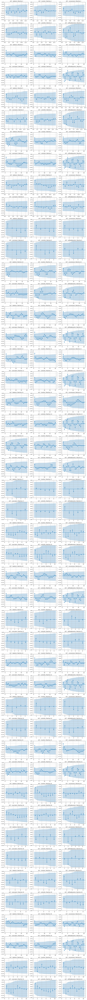

Salvato il file PDF in: /content/acf_grid.pdf


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
pdf_path = "/content/acf_grid.pdf"
plot_acf_grid_per_machine(df, feature_cols, pdf_path=pdf_path)

The blue shaded area represents the confidence interval, indicating the range within which the autocorrelation is statistically not significant.

In our case, the intervals were quite wide, likely due to having too few records for each machine.

In [ ]:
def plot_pacf_boxplots_per_feature(df, feature_cols, lag_limit=30):
    results = []

    for machine_id, group in df.groupby('machine_id'):
        for feature in feature_cols:
            series = group[feature].dropna().values
            series_len = len(series)

            max_lag_local = min(lag_limit, series_len // 2)
            if max_lag_local < 1:
                continue

            pacf_vals = pacf(series, nlags=max_lag_local, method='yw')

            for lag in range(1, max_lag_local + 1):
                results.append({
                    'machine_id': machine_id,
                    'feature': feature,
                    'lag': lag,
                    'pacf': pacf_vals[lag]
                })

    pacf_df = pd.DataFrame(results)
    features = pacf_df['feature'].unique()
    n_features = len(features)
    cols = 2
    rows = math.ceil(n_features / cols)

    fig, axs = plt.subplots(rows, cols, figsize=(cols * 6, rows * 4), sharex=True)
    axs = axs.flatten()

    for i, feature in enumerate(features):
        ax = axs[i]
        sns.boxplot(data=pacf_df[pacf_df['feature'] == feature], x='lag', y='pacf', ax=ax)
        ax.set_title(f'PACF: {feature}')
        ax.set_ylim(-5, 5)
        ax.set_xlabel('Lag')
        ax.set_ylabel('PACF')
        ax.axhline(1, color='red', linestyle='--', linewidth=1)
        ax.axhline(-1, color='red', linestyle='--', linewidth=1)

    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])

    fig.tight_layout()
    plt.show()


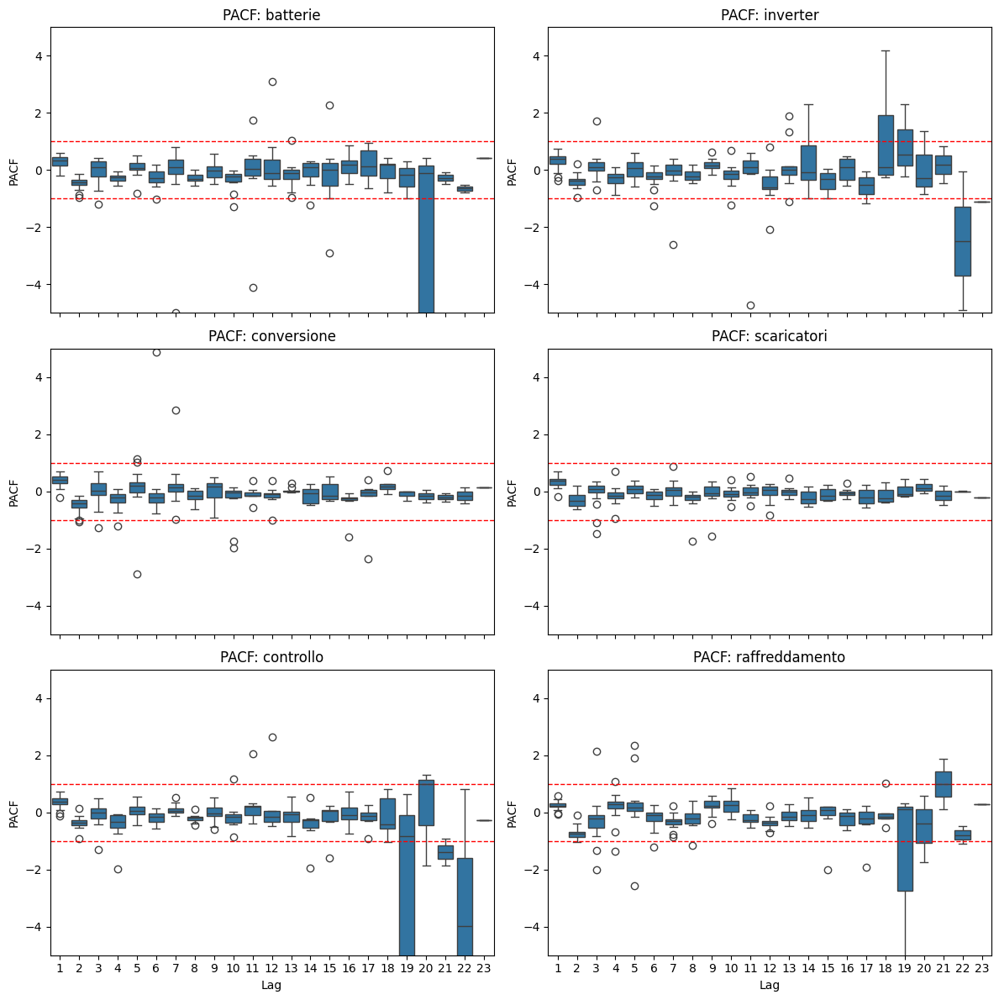

In [ ]:
plot_pacf_boxplots_per_feature(df, feature_cols)

Checking stationariety

In [ ]:
def check_stationarity_per_feature(df, exclude_cols=None, verbose=True):
    if exclude_cols is None:
        exclude_cols = ['RUL', 'machine_id', 'Unnamed: 0', 'time', 'cycle']

    feature_cols = [col for col in df.select_dtypes(include='number').columns if col not in exclude_cols]
    results = []

    for machine in sorted(df['machine_id'].unique()):
        if verbose:
            print(f"\nMachine ID: {int(machine)}")
        subset = df[df['machine_id'] == machine]
        for col in feature_cols:
            series = subset[col].dropna()
            if series.nunique() >= 3:
                try:
                    p_value = adfuller(series)[1]
                    status = "Stationary" if p_value < 0.05 else "Not stationary"
                    if verbose:
                        print(f" - {col}: p = {p_value:.4f} → {status}")
                    results.append({
                        "machine_id": int(machine),
                        "feature": col,
                        "p_value": p_value,
                        "status": status
                    })
                except:
                    if verbose:
                        print(f" - {col}: Error")

    results_df = pd.DataFrame(results)
    summary = results_df.groupby("feature")["status"].value_counts().unstack(fill_value=0)
    summary = summary[["Stationary", "Not stationary"]].astype(int)

    return results_df, summary



In [ ]:
results_df, summary = check_stationarity_per_feature(df, verbose=True)
print(summary)


Machine ID: 2
 - batterie: p = 0.0000 → Stationary
 - inverter: p = 0.0000 → Stationary
 - conversione: p = 0.9038 → Not stationary
 - scaricatori: p = 0.2068 → Not stationary
 - controllo: p = 0.0021 → Stationary
 - raffreddamento: p = 0.0805 → Not stationary

Machine ID: 3
 - batterie: p = 0.1564 → Not stationary
 - inverter: p = 0.4362 → Not stationary
 - conversione: p = 0.6915 → Not stationary
 - scaricatori: p = 0.0503 → Not stationary
 - controllo: p = 0.0001 → Stationary
 - raffreddamento: p = 0.3461 → Not stationary

Machine ID: 5
 - batterie: p = 0.1940 → Not stationary
 - inverter: p = 0.1092 → Not stationary
 - conversione: p = 0.7423 → Not stationary
 - scaricatori: p = 0.0048 → Stationary
 - controllo: p = 0.9188 → Not stationary
 - raffreddamento: p = 0.0006 → Stationary

Machine ID: 7
 - batterie: p = 0.2977 → Not stationary
 - inverter: p = 0.0207 → Stationary
 - conversione: p = 0.0056 → Stationary
 - scaricatori: p = 0.0046 → Stationary
 - controllo: p = 0.0010 → St

Noise Analysis. A Signal to Noise ratio is computed by using Wavelet Decomposition. The SNR is calculated for each feature sensor and for each machine; the aim is trying to understand which machine has more noise and for which specific feature.

In [ ]:
def calculate_snr_wavelet(signal, wavelet='db4', level=1):
    coeffs = pywt.wavedec(signal, wavelet, level=level) #approximation(signal), details(noise)
    signal_power = np.sum(coeffs[0]**2)
    noise_power = np.sum(np.concatenate(coeffs[1:])**2)


    if noise_power == 0:
        return np.inf
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

def snr_per_machine(df, sensor_cols, wavelet='db4', level=3):
    snr_results = []

    for machine_id, group in df.groupby('machine_id'):
        snr_dict = {'machine_id': machine_id}
        for col in sensor_cols:
            signal = group[col].values
            snr_val = calculate_snr_wavelet(signal, wavelet, level)
            snr_dict[col] = snr_val
        snr_results.append(snr_dict)

    return pd.DataFrame(snr_results)


In [ ]:
sensor_cols = ['batterie', 'inverter', 'conversione', 'scaricatori', 'controllo', 'raffreddamento']

snr_df = snr_per_machine(df, sensor_cols)
print(snr_df)

    machine_id   batterie   inverter  conversione  scaricatori  controllo  \
0          2.0  45.517548  37.984183    45.400991    31.545194  36.514973   
1          3.0  41.620263  31.098256    43.600884    33.937310  33.927182   
2          5.0  43.129014  31.993039    37.808266    37.171447  30.128121   
3          7.0  41.505921  26.005447    37.688876    35.454430  34.196337   
4          8.0  42.980582  33.578576    44.283620    36.229263  35.213294   
5          9.0  44.720129  27.923111    42.743119    36.381655  33.558083   
6         10.0  41.583427  30.653811    38.821355    34.208094  33.203896   
7         12.0  40.864920  29.660021    40.554373    32.296190  33.076914   
8         13.0  38.962841  31.386810    39.752801    33.902429  37.648579   
9         14.0  43.123366  29.859656    40.520183    37.284722  32.946179   
10        15.0  39.902188  29.612941    43.986873    36.486670  31.604219   
11        17.0  44.673625  32.367741    32.512947    38.339880  39.908565   

/usr/local/lib/python3.11/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 3 is too high: all coefficients will experience boundary effects.
  warnings.warn(


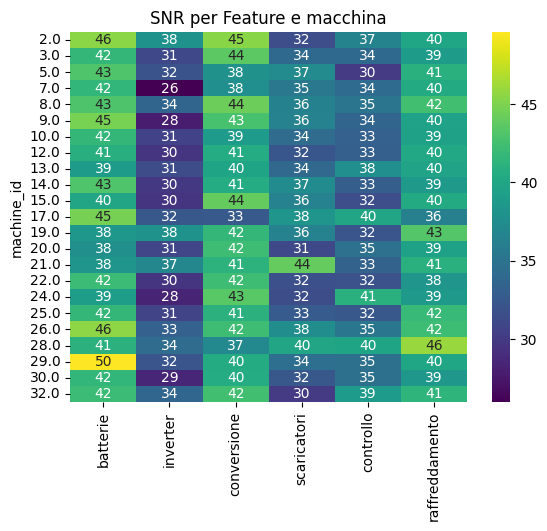

In [ ]:
sns.heatmap(snr_df.set_index("machine_id"), cmap="viridis", annot=True)
plt.title("SNR per Feature e macchina")
plt.show()


Trying to better understand noise. Variability for "Scaricatori" and "Controllo" show a rolling standard deviation that increase in  the final cycle. This could mean that there is a significant deviation from the mean, and a possible degradation of the machine could occur.

In [ ]:
def add_rolling_and_lag_features(df, feature_cols, window=5, lags=[1, 2, 3]):

    df = df.copy()

    for machine in df['machine_id'].unique():
        df_machine = df[df['machine_id'] == machine].sort_values('cycle')

        for col in feature_cols:
            roll_mean = df_machine[col].rolling(window=window, min_periods=1).mean()
            roll_std = df_machine[col].rolling(window=window, min_periods=1).std()

            df.loc[df_machine.index, f'{col}_rollmean'] = roll_mean
            df.loc[df_machine.index, f'{col}_rollstd'] = roll_std

            for lag in lags:
                df.loc[df_machine.index, f'{col}_lag{lag}'] = df_machine[col].shift(lag)

    return df


def plot_feature_with_rolling(df, machine_id, feature):

    df_machine = df[df['machine_id'] == machine_id].sort_values('cycle')

    plt.figure(figsize=(10, 5))
    plt.plot(df_machine['cycle'], df_machine[feature], label='Originale', alpha=0.6)
    plt.plot(df_machine['cycle'], df_machine[f'{feature}_rollmean'], label='Rolling Mean', linewidth=2)
    plt.fill_between(
        df_machine['cycle'],
        df_machine[f'{feature}_rollmean'] - df_machine[f'{feature}_rollstd'],
        df_machine[f'{feature}_rollmean'] + df_machine[f'{feature}_rollstd'],
        color='orange', alpha=0.3, label='Rolling Std Dev'
    )
    plt.xlabel('Cycle')
    plt.ylabel(feature)
    plt.title(f'Machine {machine_id} - {feature}: Originale + Rolling Mean/Std')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


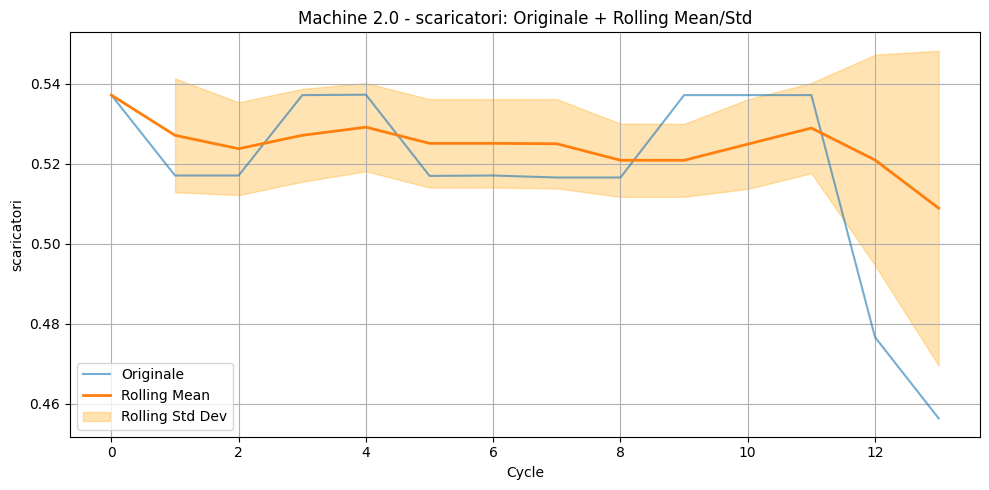

In [ ]:


df_rolling = add_rolling_and_lag_features(df, feature_cols, window=5, lags=[1, 2, 3])

plot_feature_with_rolling(df_rolling, machine_id=df_rolling['machine_id'].unique()[0], feature='scaricatori')


# Model Evaluation

# Random Forest


We have to create lagged variables to give them as input in the model

In [ ]:
def create_lagged_features(df, group_col, target_cols, lags):

    df_sorted = df.sort_values(by=[group_col, 'cycle']).copy()
    for lag in lags:
        for col in target_cols:
            df_sorted[f'{col}_lag{lag}'] = df_sorted.groupby(group_col)[col].shift(lag)
    return df_sorted

def prepare_data(df, target_col, group_col, exclude_cols=None, drop_na=True):

    if exclude_cols is None:
        exclude_cols = []
    exclude_cols = set(exclude_cols + [target_col, group_col])
    X = df.drop(columns=exclude_cols)
    y = df[target_col]

    if drop_na:
        data = pd.concat([X, y], axis=1).dropna()
        X = data.drop(columns=[target_col])
        y = data[target_col]

    return X, y

def train_and_evaluate_rf(X_train, y_train, X_test, y_test, n_estimators=100, random_state=42):

    model = RandomForestRegressor(n_estimators=n_estimators, random_state=random_state)
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    rmse = mse ** 0.5
    r2 = r2_score(y_test, y_pred)

    print(f'RMSE: {rmse:.2f}')
    print(f'R^2: {r2:.2f}')

    return model




In [ ]:
df_lag = create_lagged_features(df, group_col='machine_id', target_cols=feature_cols, lags=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
df_lag.head(10)

,batterie,inverter,conversione,scaricatori,controllo,raffreddamento,RUL,machine_id,cycle,time,...,conversione_lag9,scaricatori_lag9,controllo_lag9,raffreddamento_lag9,batterie_lag10,inverter_lag10,conversione_lag10,scaricatori_lag10,controllo_lag10,raffreddamento_lag10
1,0.5229,0.5070,0.5098,0.5371,0.5256,0.5330,13,2.0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.5126,0.5180,0.5133,0.5170,0.5090,0.5323,12,2.0,1,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.5063,0.5067,0.5058,0.5170,0.5022,0.5185,11,2.0,2,6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.5174,0.4994,0.5007,0.5371,0.5265,0.5120,10,2.0,3,9,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.5122,0.5266,0.5066,0.5372,0.5135,0.5253,9,2.0,4,12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,0.5099,0.5124,0.5068,0.5169,0.5097,0.5324,8,2.0,5,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,0.5145,0.5097,0.5082,0.5170,0.5316,0.5227,7,2.0,6,18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,0.5131,0.5185,0.5077,0.5165,0.5376,0.5118,6,2.0,7,21,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,0.5192,0.5284,0.4989,0.5165,0.5131,0.5106,5,2.0,8,24,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,0.5142,0.5045,0.4987,0.5371,0.5085,0.5202,4,2.0,9,27,...,0.5098,0.5371,0.5256,0.533,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
feature_cols = ['batterie', 'inverter', 'conversione', 'scaricatori', 'controllo', 'raffreddamento']


df_with_lags = create_lagged_features(df, group_col='machine_id', target_cols=feature_cols, lags=[1,2,3,4,5,6,7,8,9,10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20])

X, y = prepare_data(df_with_lags, target_col='RUL', group_col='machine_id', exclude_cols=['cycle', 'time'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = train_and_evaluate_rf(X_train, y_train, X_test, y_test)

<ipython-input-80-28f7a259d666>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_sorted[f'{col}_lag{lag}'] = df_sorted.groupby(group_col)[col].shift(lag)
<ipython-input-80-28f7a259d666>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_sorted[f'{col}_lag{lag}'] = df_sorted.groupby(group_col)[col].shift(lag)
<ipython-input-80-28f7a259d666>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once u

RMSE: 1.48
R^2: 0.92


Results are not so good, we can try with another model.

# LSTM

We need to build different windows.

In [ ]:
def create_sequences(df, feature_cols, timesteps):
    X_seq = []
    y_seq = []

    for machine_id in df['machine_id'].unique():
        df_machine = df[df['machine_id'] == machine_id].sort_values("cycle")
        data = df_machine[feature_cols].values
        target = df_machine['RUL'].values

        for end_idx in range(timesteps, len(data) + 1):
            x = data[end_idx - timesteps:end_idx]
            y = target[end_idx - 1]

            X_seq.append(x)
            y_seq.append(y)

    return np.array(X_seq), np.array(y_seq)

In [ ]:
timesteps = 5
feature_cols = ['batterie', 'scaricatori', 'controllo', 'raffreddamento', 'inverter', 'conversione']

X_seq, y_seq = create_sequences(df, feature_cols, timesteps)

In [ ]:
def lstm_model():
    model = Sequential([
        LSTM(32, return_sequences=False),
        Dense(16, activation='relu'),
        Dense(8, activation='relu'),
        Dense(1)  #Regressione: RUL
    ])

    model.compile(loss='mse', optimizer=Adam(learning_rate=0.001), metrics=['mae'])
    model.summary()
    return model

In [ ]:
lstm = lstm_model()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
def train_model(model, X_seq, y_seq):
    X_train, X_test, y_train, y_test = train_test_split(X_seq, y_seq, test_size=0.2, random_state=42)

    history = model.fit(X_train, y_train,
                        validation_data=(X_test, y_test),
                        epochs=100, batch_size=32)

    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.xlabel("Epochs")
    plt.ylabel("MSE")
    plt.legend()
    plt.title("Loss Curve")
    plt.show()

    # Predizione
    y_pred = model.predict(X_test)

    plt.scatter(y_test, y_pred, alpha=0.3)
    plt.xlabel("True RUL")
    plt.ylabel("Predicted RUL")
    plt.title("RUL prediction")
    plt.grid(True)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    plt.show()

    return history, model

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step - loss: 300.2088 - mae: 13.5004 - val_loss: 274.2616 - val_mae: 13.2787
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 286.9560 - mae: 13.2867 - val_loss: 272.2359 - val_mae: 13.2118
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 277.4427 - mae: 12.7586 - val_loss: 268.7356 - val_mae: 13.0953
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 255.1749 - mae: 12.5465 - val_loss: 261.8673 - val_mae: 12.8633
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 260.8007 - mae: 12.3576 - val_loss: 249.5644 - val_mae: 12.4392
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 249.1182 - mae: 12.1004 - val_loss: 231.0973 - val_mae: 11.8213
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 220.8123 - mae: 11.0106 - val_loss: 207.9937 - val_mae: 11.0507
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 211.6971 - mae: 10.6070 - val_loss: 182.1161 - val_mae: 10.1852
Epoch 9/

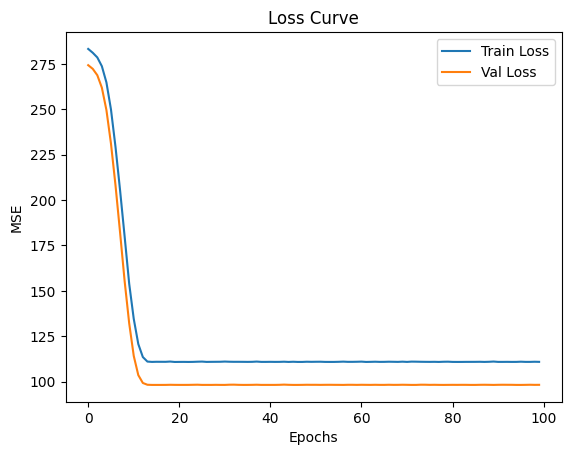

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step


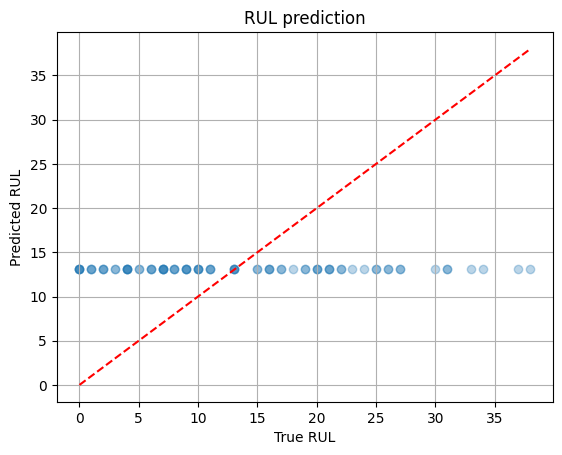

In [ ]:
lstm_history, lstm_model = train_model(lstm, X_seq, y_seq)


In [ ]:
def plot_loss_and_mae(history, model):
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss (MSE)')
    plt.plot(history.history['val_loss'], label='Val Loss (MSE)')
    plt.title('Loss (MSE) per Epoca')
    plt.xlabel('Epoch')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)



    # MAE
    plt.subplot(1, 2, 2)
    plt.plot(history.history['mae'], label='Train MAE')
    plt.plot(history.history['val_mae'], label='Val MAE')
    plt.title('MAE per Epoca')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

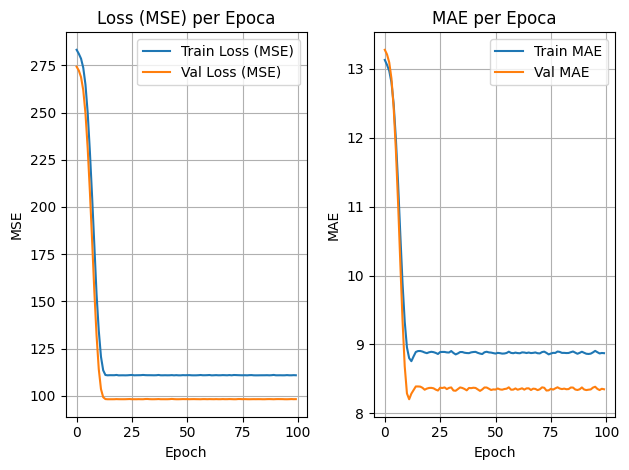

In [ ]:
plot_loss_and_mae(lstm_history, lstm_model)

# MLP

In [ ]:
df_lagged = df.copy()

for col in feature_cols:
    for lag in range(1, 6):  # lag 1 to 5
        df_lagged[f'{col}_lag{lag}'] = df_lagged.groupby('machine_id')[col].shift(lag)

# Rimuoviamo le righe con valori NaN dovuti ai lag
df_lagged.dropna(inplace=True)

# Definiamo le nuove colonne delle feature laggate
lagged_feature_cols = [f'{col}_lag{lag}' for col in feature_cols for lag in range(1, 6)]


In [ ]:
# Input: solo feature laggate
X = df_lagged[lagged_feature_cols].values
y = df_lagged['RUL'].values

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
def mlp_model():
    model = Sequential([
        Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(32, activation='relu'),
        Dense(1)  # Regressione RUL
    ])
    model.compile(optimizer=Adam(learning_rate=0.0005), loss='mse', metrics=['mae'])
    model.summary()
    return model

In [ ]:
mlp = mlp_model()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 64)             │         1,984 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,097 (16.00 KB)

 Trainable params: 4,097 (16.00 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = mlp.fit(X_train, y_train, epochs=100, validation_split=0.2, verbose=1)

# Valutazione
loss, mae = mlp.evaluate(X_test, y_test, verbose=0)
print(f"MAE: {mae:.2f}")


Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 290.4848 - mae: 13.7399 - val_loss: 198.6969 - val_mae: 10.8115
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 263.4824 - mae: 12.5543 - val_loss: 190.2935 - val_mae: 10.4938
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 271.6950 - mae: 12.9782 - val_loss: 181.5654 - val_mae: 10.1734
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 259.8815 - mae: 12.1258 - val_loss: 173.1210 - val_mae: 9.8705
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 229.4670 - mae: 11.5883 - val_loss: 164.6796 - val_mae: 9.5747
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 222.1364 - mae: 11.5217 - val_loss: 155.9164 - val_mae: 9.3120
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 243.5773 - mae: 11.6866 - val_loss: 147.1309 - val_mae: 9.0424
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 219.3169 - mae: 11.0193 - val_loss: 138.1554 - val_mae: 8.7750
Epoch 9/100
8/8 ━━━━━━━━━━━━━

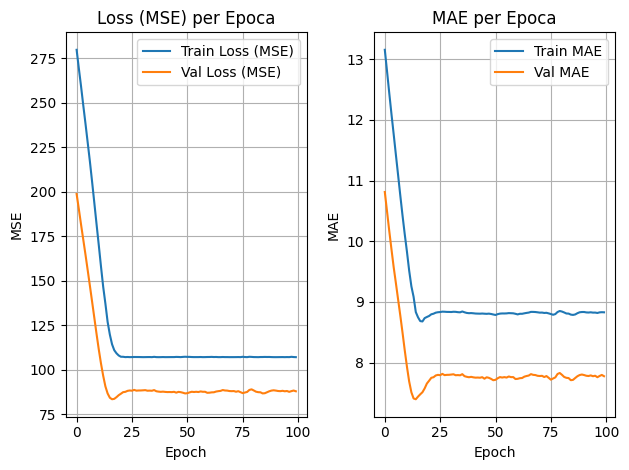

In [ ]:
plot_loss_and_mae(history, mlp)


# RNN

In [ ]:
timesteps = 5
feature_cols = ['batterie', 'scaricatori', 'controllo', 'raffreddamento', 'inverter', 'conversione']

X_seq, y_seq = create_sequences(df, feature_cols, timesteps)

In [ ]:
def rnn_model():
    model = Sequential([
        SimpleRNN(32, input_shape=(timesteps, len(feature_cols))),
        Dense(16, activation='relu'),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer=Adam(learning_rate=0.001), metrics=['mae'])
    model.summary()
    return model

In [ ]:
rnn = rnn_model()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn (SimpleRNN)          │ (None, 32)             │         1,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,793 (7.00 KB)

 Trainable params: 1,793 (7.00 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 291.9965 - mae: 13.3603 - val_loss: 247.2891 - val_mae: 12.3646
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 265.8785 - mae: 12.3575 - val_loss: 224.6750 - val_mae: 11.6045
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 221.0473 - mae: 11.2221 - val_loss: 201.1862 - val_mae: 10.8229
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 188.6538 - mae: 10.0698 - val_loss: 177.7397 - val_mae: 10.0531
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 179.1839 - mae: 10.2169 - val_loss: 154.6156 - val_mae: 9.3296
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 164.0462 - mae: 9.5252 - val_loss: 134.6782 - val_mae: 8.7430
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 146.7117 - mae: 9.2017 - val_loss: 119.1589 - val_mae: 8.3765
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 137.6247 - mae: 9.2492 - val_loss: 108.6840 - val_mae: 8.2135
Epoch 9/100
10/

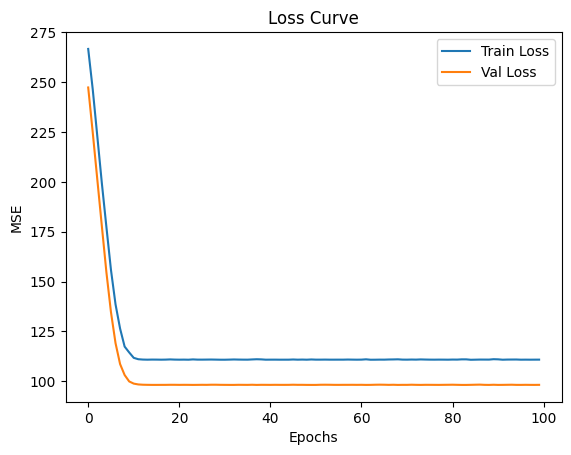

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


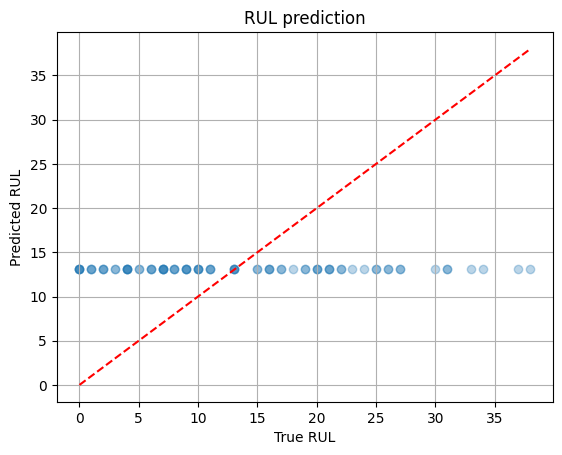

In [ ]:
rnn_history, rnn_model = train_model(rnn, X_seq, y_seq)

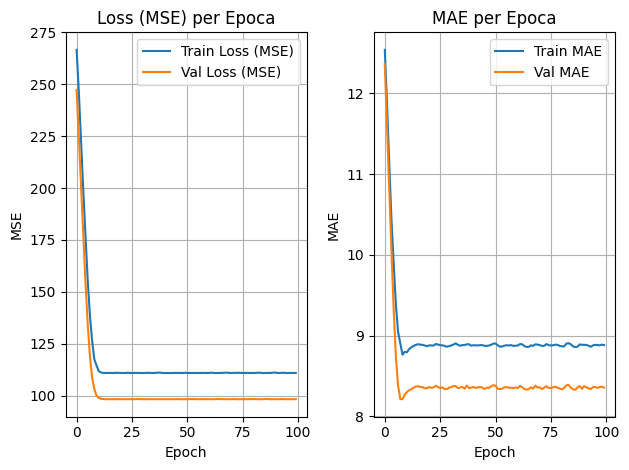

In [ ]:
plot_loss_and_mae(rnn_history, rnn_model)

# **Grid Search**

We can try to optimize one of our best model, trying to find the best hyperparameters with a GridSearch.

We can try also to build a more complex model.

In [ ]:
def build_model(input_shape, learning_rate):
    model = Sequential([
        LSTM(128, input_shape = input_shape, return_sequences=True, activation = "tanh"),
        LSTM(64, activation = "tanh", return_sequences = True),
        LSTM(32, activation = "tanh"),
        Dense(96, activation = "relu"),
        Dense(128, activation = "relu"),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer=Adam(learning_rate=learning_rate), metrics=['mae'])
    return model


We implemetn an early stopping to choose the best hyperparameter in which the validation loss is the minimum.


🔍 Training → timesteps=20, batch_size=16, lr=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 1.
🛑 Early stopped at epoch 21

🔍 Training → timesteps=20, batch_size=16, lr=0.001
Epoch 24: early stopping
Restoring model weights from the end of the best epoch: 4.
🛑 Early stopped at epoch 24

🔍 Training → timesteps=20, batch_size=16, lr=0.0005
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 7.
🛑 Early stopped at epoch 27

🔍 Training → timesteps=20, batch_size=32, lr=0.005
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 6.
🛑 Early stopped at epoch 26

🔍 Training → timesteps=20, batch_size=32, lr=0.001
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 7.
🛑 Early stopped at epoch 27

🔍 Training → timesteps=20, batch_size=32, lr=0.0005
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 12.
🛑 Early stopped at epoch 32

🔍 Training → timesteps=25, batch_size=16, lr=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 41: early stopping
Restoring model weights from the end of the best epoch: 21.
🛑 Early stopped at epoch 41

🔍 Training → timesteps=25, batch_size=16, lr=0.001
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 7.
🛑 Early stopped at epoch 27

🔍 Training → timesteps=25, batch_size=16, lr=0.0005
Epoch 32: early stopping
Restoring model weights from the end of the best epoch: 12.
🛑 Early stopped at epoch 32

🔍 Training → timesteps=25, batch_size=32, lr=0.005
Epoch 30: early stopping
Restoring model weights from the end of the best epoch: 10.
🛑 Early stopped at epoch 30

🔍 Training → timesteps=25, batch_size=32, lr=0.001
Epoch 36: early stopping
Restoring model weights from the end of the best epoch: 16.
🛑 Early stopped at epoch 36

🔍 Training → timesteps=25, batch_size=32, lr=0.0005
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 11.
🛑 Early stopped at epoch 31

🔍 Training → timesteps=30, batch_size=16, lr=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 50: early stopping
Restoring model weights from the end of the best epoch: 30.
🛑 Early stopped at epoch 50

🔍 Training → timesteps=30, batch_size=16, lr=0.001
Epoch 27: early stopping
Restoring model weights from the end of the best epoch: 7.
🛑 Early stopped at epoch 27

🔍 Training → timesteps=30, batch_size=16, lr=0.0005
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 11.
🛑 Early stopped at epoch 31

🔍 Training → timesteps=30, batch_size=32, lr=0.005
Epoch 23: early stopping
Restoring model weights from the end of the best epoch: 3.
🛑 Early stopped at epoch 23

🔍 Training → timesteps=30, batch_size=32, lr=0.001
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 9.
🛑 Early stopped at epoch 29

🔍 Training → timesteps=30, batch_size=32, lr=0.0005
Epoch 37: early stopping
Restoring model weights from the end of the best epoch: 17.
🛑 Early stopped at epoch 37


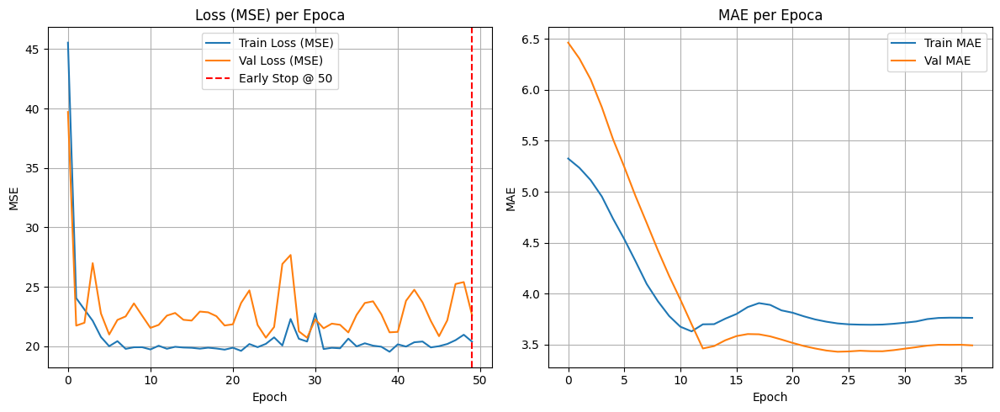

In [ ]:
timesteps_list = [20, 25, 30]
batch_sizes = [16, 32]
learning_rates = [ 0.005, 0.001, 0.0005 ]
epochs = 100

results = []
best_mae = float('inf')
best_model = None
best_history = None

for timesteps in timesteps_list:
    X_seq, y_seq = create_sequences(df, feature_cols, timesteps)
    X_train, X_test, y_train, y_test = train_test_split(X_seq, y_seq, test_size=0.2, random_state=42)

    input_shape = (X_seq.shape[1], X_seq.shape[2])

    for batch_size in batch_sizes:
        for lr in learning_rates:
            print(f"\n🔍 Training → timesteps={timesteps}, batch_size={batch_size}, lr={lr}")
            model = build_model(input_shape, learning_rate=lr)

            early_stop = EarlyStopping(
                monitor='val_loss',
                patience=20,
                restore_best_weights=True,
                verbose=1
            )

            history = model.fit(
                X_train, y_train,
                validation_data=(X_test, y_test),
                epochs=epochs,
                batch_size=batch_size,
                callbacks=[early_stop],
                verbose=0
            )

            final_val_mae = history.history['val_mae'][-1]
            stopped_epoch = len(history.history['loss'])

            print(f"🛑 Early stopped at epoch {stopped_epoch}")

            results.append({
                'timesteps': timesteps,
                'batch_size': batch_size,
                'learning_rate': lr,
                'val_mae': final_val_mae
            })

            if final_val_mae < best_mae:
                best_mae = final_val_mae
                best_model = model
                best_history = history
                best_epoch = stopped_epoch

plt.figure(figsize=(12, 5))

# LOSS
plt.subplot(1, 2, 1)
plt.plot(best_history.history['loss'], label='Train Loss (MSE)')
plt.plot(best_history.history['val_loss'], label='Val Loss (MSE)')
plt.axvline(best_epoch - 1, color='red', linestyle='--', label=f'Early Stop @ {best_epoch}')
plt.title('Loss (MSE) per Epoca')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.grid(True)



# MAE
plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Train MAE')
plt.plot(history.history['val_mae'], label='Val MAE')
plt.title('MAE per Epoca')
plt.xlabel('Epoch')
plt.ylabel('MAE')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by='val_mae')
print(results_df.head())
best_params = results_df.iloc[0]
print("Migliori parametri:", best_params)

    timesteps  batch_size  learning_rate   val_mae
12         30          16         0.0050  3.453449
16         30          32         0.0010  3.461400
15         30          32         0.0050  3.477285
17         30          32         0.0005  3.493683
14         30          16         0.0005  3.498224
Migliori parametri: timesteps        30.000000
batch_size       16.000000
learning_rate     0.005000
val_mae           3.453449
Name: 12, dtype: float64


As we can see, the best parameters includes timesteps = 30, so even though we cut a lot of information the model performs better.

**EoL Classifier**

 Since available data includes artificially constructed Remaining Useful Life (RUL) estimates that follow a linear trend, and considering that the dataset does not contain actual failure events, our aim might be to analyze anomalous cycles using an Early Onset of Failure(EOL) classifier. It simply predicts whether a machine is likely to fail soon (for example, within the last 5-10% of its life cycle). It simplifies the problem: instead of estimating a precise remaining time, it focuses on a binary decision — "fail soon" or "not fail soon." It increases robustness: the “fail soon” label is less sensitive to inaccuracies in the artificial RUL values, since it relies on a defined threshold. It makes maintenance decisions clearer and more actionable: by flagging when the machine enters the critical "fail soon" phase, it facilitates timely interventions.

Pre-Processing & Feature Selection

In [ ]:
def compute_total_cycles(df, id_col='machine_id', cycle_col='cycle'):
    df['total_cycles'] = df.groupby(id_col)[cycle_col].transform('max')
    return df

def create_frac_left(df, cycle_col='cycle'):
    df['frac_left'] = (df['total_cycles'] - df[cycle_col]) / df['total_cycles']
    return df

def create_fail_soon_label(df, threshold):
    df['fail_soon'] = (df['frac_left'] <= threshold).astype(int)
    return df

def create_lagged_features(df, sensor_cols, window_size, id_col='machine_id', cycle_col='cycle'):
    df = df.sort_values([id_col, cycle_col])
    for lag in range(window_size):
        lagged = df.groupby(id_col)[sensor_cols].shift(lag)
        lagged.columns = [f'{col}_lag{lag}' for col in sensor_cols]
        df = pd.concat([df, lagged], axis=1)
    df = df.dropna().reset_index(drop=True)
    return df

def compute_sensor_statistics(df, sensor_cols, id_col='machine_id'):
    agg_funcs = ['mean', 'std', 'min', 'max']
    for col in sensor_cols:
        for func in agg_funcs:
            df[f"{col}_{func}"] = df.groupby(id_col)[col].transform(func)
    return df

def prepare_train_test(df, feature_cols, target_col='fail_soon'):
    X = df[feature_cols]
    y = df[target_col]
    return train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

Data Split and Balancing between train and test

In [ ]:

def run_grid_search(df, sensor_cols, thresholds, window_sizes):
    best_score = -1
    best_params = {}
    best_data = None
    best_feature_cols = None

    for thresh in thresholds:
        for window_size in window_sizes:
            print(f"Testing threshold={thresh}, window_size={window_size}")

            df_temp = create_fail_soon_label(df.copy(), thresh)
            df_lagged = create_lagged_features(df_temp, sensor_cols, window_size)
            df_enriched = compute_sensor_statistics(df_lagged, sensor_cols)

            feature_cols = [
                col for col in df_enriched.columns
                if col not in ['machine_id', 'cycle', 'total_cycles', 'frac_left', 'fail_soon', 'RUL']
            ]

            try:
                X_train, X_test, y_train, y_test = prepare_train_test(df_enriched, feature_cols)
            except ValueError:
                continue

            if len(X_train) == 0 or len(X_test) == 0:
                continue

            model = RandomForestClassifier(random_state=42)
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            score = f1_score(y_test, y_pred)

            print(f"F1 score: {score:.4f}")

            if score > best_score:
                best_score = score
                best_params = {'threshold': thresh, 'window_size': window_size}
                best_data = (X_train, X_test, y_train, y_test)
                best_feature_cols = feature_cols

    return best_score, best_params, best_data, best_feature_cols

def run_model_grid_search(X_train, y_train):
    param_grid = {
        'n_estimators': [50, 100, 200],
        'max_depth': [5, 10, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'class_weight': [None, 'balanced']
    }

    grid_search = GridSearchCV(
        RandomForestClassifier(random_state=42),
        param_grid,
        scoring='f1',
        cv=3,
        n_jobs=-1
    )

    print("Running Random Forest hyperparameter grid search...")
    grid_search.fit(X_train, y_train)
    return grid_search

Grid Searchg Over Data Preparation Parameters

Grid Search for RF Hyperparameters

Evaluation and visualization

In [ ]:
def print_classification_report(model, X_test, y_test):
    y_pred = model.predict(X_test)
    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=["No Failure", "Fail Soon"], zero_division=0))

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["No Failure", "Fail Soon"], yticklabels=["No Failure", "Fail Soon"])
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

def plot_roc_curve(model, X_test, y_test):
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.3f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

Main Pipe-Line

In [ ]:
def eol_classification_pipeline(df, sensor_columns):
    df = compute_total_cycles(df)
    df = create_frac_left(df)

    thresholds_grid = [0.05, 0.1, 0.15]
    window_sizes_grid = [3, 5, 7]

    best_score, best_params, best_data, best_feature_cols = run_grid_search(df, sensor_columns, thresholds_grid, window_sizes_grid)

    if best_data is None:
        print("No valid configuration found.")
        return

    print(f"Best configuration: {best_params} with F1 score: {best_score:.4f}")

    X_train, X_test, y_train, y_test = best_data

    grid_search = run_model_grid_search(X_train, y_train)
    best_model = grid_search.best_estimator_

    print(f"Best RF hyperparameters: {grid_search.best_params_}")

    print_classification_report(best_model, X_test, y_test)
    plot_roc_curve(best_model, X_test, y_test)

In [ ]:
eol_classification_pipeline(df, feature_cols)

Testing threshold=0.05, window_size=3


TypeError: prepare_train_test() missing 1 required positional argument: 'window_size'

**Piece-wise RUL approach(regression)**

**RandomForest**

In [ ]:
def piecewise_rul(cycle, max_cycle, plateau_len):
    cutoff = max_cycle - plateau_len
    return plateau_len if cycle <= cutoff else max_cycle - cycle

def create_piecewise_target(df, plateau_len):
    max_cycles = df.groupby('machine_id')['cycle'].transform('max')
    return df.apply(lambda row: piecewise_rul(row['cycle'], max_cycles[row.name], plateau_len), axis=1)


def create_lagged_features(df, cols, n_lag):
    df = df.sort_values(['machine_id', 'cycle']).copy()
    for col in cols:
        for lag in range(1, n_lag + 1):
            df[f'{col}_lag{lag}'] = df.groupby('machine_id')[col].shift(lag)
    return df.dropna().reset_index(drop=True)

def generate_feature_cols(sensor_cols, n_lag):
    return [f'{col}_lag{lag}' for col in sensor_cols for lag in range(1, n_lag + 1)]

In [ ]:
#plateau parameter space
plateau_lens = [5, 10, 15]
n_lags = [3, 5, 7]

#RF parameter space
param_grid = {
    'model__n_estimators': [50, 100],
    'model__max_depth': [5, 10, None],
    'model__min_samples_split': [2, 5, 10],
    'model__min_samples_leaf': [1, 2, 4]
}


In [ ]:
sensor_cols = ['batterie','inverter','conversione','scaricatori','controllo','raffreddamento']

results = []
for plateau_len in plateau_lens:
    print(f'\n--- Plateau len: {plateau_len} ---')
    df['RUL_piecewise'] = create_piecewise_target(df, plateau_len)

    for n_lag in n_lags:
        print(f'Lag: {n_lag}')

        df_lagged = create_lagged_features(df, sensor_cols, n_lag)
        feature_cols = generate_feature_cols(sensor_cols, n_lag)  # genera le colonne da usare in X

        X, y = df_lagged[feature_cols], df_lagged['RUL_piecewise']
        groups = df_lagged['machine_id']

        gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
        train_idx, test_idx = next(gss.split(X, y, groups))
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        pipe = Pipeline([
            ('model', RandomForestRegressor(random_state=42))
        ])

        gs = GridSearchCV(pipe, param_grid, cv=3, scoring='neg_mean_absolute_error', n_jobs=-1)
        gs.fit(X_train, y_train)

        best_model = gs.best_estimator_
        y_pred = best_model.predict(X_test)

        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        r2 = r2_score(y_test, y_pred)

        test_info = df_lagged.iloc[test_idx][['machine_id', 'cycle']].copy()
        test_info['RUL_true'] = y_test.values
        test_info['RUL_pred'] = y_pred
        test_info['error'] = y_pred - y_test.values

        results.append({
            'plateau_len': plateau_len,
            'n_lag': n_lag,
            'best_params': gs.best_params_,
            'MAE': mae,
            'RMSE': rmse,
            'R2': r2,
            'errors_df': test_info
        })

results_df = pd.DataFrame(results)
print(results_df.sort_values('MAE'))



--- Plateau len: 5 ---
Lag: 3
Lag: 5
Lag: 7

--- Plateau len: 10 ---
Lag: 3
Lag: 5
Lag: 7

--- Plateau len: 15 ---
Lag: 3
Lag: 5
Lag: 7
   plateau_len  n_lag                                        best_params  \
0            5      3  {'model__max_depth': 5, 'model__min_samples_le...   
2            5      7  {'model__max_depth': 5, 'model__min_samples_le...   
1            5      5  {'model__max_depth': 5, 'model__min_samples_le...   
4           10      5  {'model__max_depth': 5, 'model__min_samples_le...   
3           10      3  {'model__max_depth': 5, 'model__min_samples_le...   
5           10      7  {'model__max_depth': 5, 'model__min_samples_le...   
7           15      5  {'model__max_depth': 5, 'model__min_samples_le...   
6           15      3  {'model__max_depth': 10, 'model__min_samples_l...   
8           15      7  {'model__max_depth': 5, 'model__min_samples_le...   

        MAE      RMSE        R2  \
0  1.118525  1.423845 -0.087644   
2  1.148415  1.557411 -0.108813 

**XGBoost**

In [ ]:
def compute_piecewise_rul(df, max_rul):
    df['total_cycles'] = df.groupby('machine_id')['cycle'].transform('max')
    df['true_rul'] = df['total_cycles'] - df['cycle']
    df['rul_piecewise'] = df['true_rul'].clip(upper=max_rul)
    return df

def create_lagged_features(df, sensor_cols, window_size):
    df = df.sort_values(['machine_id', 'cycle'])
    for lag in range(window_size):
        df[[f'{col}_lag{lag}' for col in sensor_cols]] = df.groupby('machine_id')[sensor_cols].shift(lag)
    return df.dropna()

def prepare_train_test(df, sensor_cols, window_size, target_col='rul_piecewise', test_size=0.20):
    feature_cols = [f'{col}_lag{lag}' for lag in range(window_size) for col in sensor_cols]
    X = df[feature_cols].reset_index(drop=True)
    y = df[target_col].reset_index(drop=True)

    return train_test_split(X, y, test_size=test_size, random_state=42), feature_cols


In [ ]:
def optimize_rul_pw_xgb(df, sensor_columns, rul_pw_candidates, window_size):
    best_rul_pw, best_rmse = None, np.inf

    for rul_pw in rul_pw_candidates:
        print(f"Testing max_rul = {rul_pw}")

        df_temp = compute_piecewise_rul(df.copy(), max_rul=rul_pw)
        df_features = create_lagged_features(df_temp, sensor_columns, window_size)
        df_features = df_features.dropna().reset_index(drop=True)

        (X_train, X_test, y_train, y_test), feature_cols = prepare_train_test(df_features, sensor_columns, window_size)

        # 🔹 Modello XGBoost
        model = XGBRegressor(
            n_estimators=100,
            learning_rate=0.1,
            max_depth=5,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42
        )
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # 🔹 Metriche di regressione
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f"RMSE: {rmse:.4f}, MAE: {mae:.4f}, R²: {r2:.4f}")

        if rmse < best_rmse:
            best_rmse = rmse
            best_rul_pw = rul_pw

    print(f"Best max_rul: {best_rul_pw} with RMSE: {best_rmse:.4f}")
    return best_rul_pw


Pipeline Principale

In [ ]:
def rul_regression_pipeline(df, sensor_columns, rul_pw_candidates, window_size):
    best_rul_pw = optimize_rul_pw_xgb(df, sensor_columns, rul_pw_candidates, window_size)

    # Ultima esecuzione con il migliore max_rul trovato
    df = compute_piecewise_rul(df, best_rul_pw)
    df = create_lagged_features(df, sensor_columns, window_size).reset_index(drop=True)

    (X_train, X_test, y_train, y_test), feature_cols = prepare_train_test(df, sensor_columns, window_size)

    model = XGBRegressor(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # 🔹 Metriche finali
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Final Evaluation with best max_rul = {best_rul_pw}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE:  {mae:.4f}")
    print(f"R²:   {r2:.4f}")


In [ ]:
rul_pw_candidates = [5, 10, 15, 20, 30]
window_size = 5
rul_regression_pipeline(df, sensor_cols, rul_pw_candidates, window_size)


Testing max_rul = 5
RMSE: 1.3880, MAE: 0.9880, R²: 0.1289
Testing max_rul = 10
RMSE: 3.5545, MAE: 2.9318, R²: -0.1025
Testing max_rul = 15
RMSE: 5.7253, MAE: 4.8695, R²: -0.1591
Testing max_rul = 20
RMSE: 7.3021, MAE: 6.4080, R²: -0.0511
Testing max_rul = 30
RMSE: 9.4771, MAE: 7.7986, R²: -0.0413
Best max_rul: 5 with RMSE: 1.3880
Final Evaluation with best max_rul = 5
RMSE: 1.3880
MAE:  0.9880
R²:   0.1289


**Survival analysis**

In [ ]:
rul_per_machine = df.groupby('machine_id')['cycle'].max().reset_index()
rul_per_machine.columns = ['machine_id', 'max_cycle']

df = df.merge(rul_per_machine, on='machine_id', how='left')
df['time_1'] = df['max_cycle'] - df['cycle']  #time starting from the current cycle
df['event'] = 1  #observation reaching failure, observed event

In [ ]:
counts = df.groupby('machine_id')['time_1'].max()
valid_units = counts[counts > 15].index #using only machine with more than 15 cycles
df_filtered = df[df['machine_id'].isin(valid_units)].copy()

#clipping first cycles to focus on the last one
def clip_first(group):
    return group[group['time_1'] > group['time_1'].min() + 6]

df_clipped = df_filtered.groupby('machine_id').apply(clip_first).reset_index(drop=True)

<ipython-input-43-d31c253814cd>:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_clipped = df_filtered.groupby('machine_id').apply(clip_first).reset_index(drop=True)


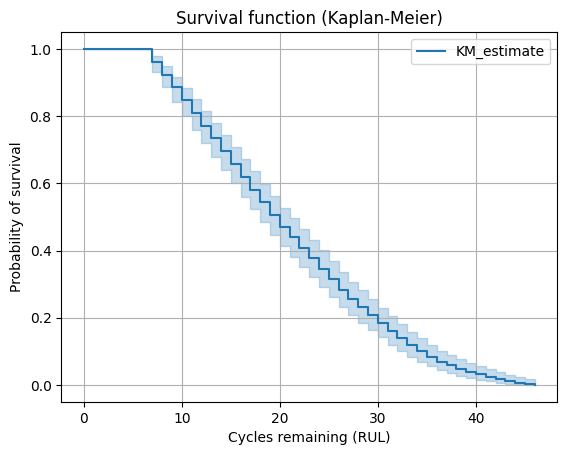

In [ ]:
from lifelines import KaplanMeierFitter
kmf = KaplanMeierFitter()
kmf.fit(durations=df_clipped['time_1'], event_observed=df_clipped['event'])
kmf.plot()
plt.title("Survival function (Kaplan-Meier)")
plt.xlabel("Cycles remaining (RUL)")
plt.ylabel("Probability of survival")
plt.grid()
plt.show()